**_E-Commerce Customer Segmentation_**

The dataset has information of 100k orders from 2016 to 2018 made at multiple marketplaces in Brazil. Its features allows viewing an order from multiple dimensions: from order status, price, payment and freight performance to customer location, product attributes and reviews by customers

**_Statement_**

Customer segmentation is not only important, but vital, in order to optimize your marketing strategies, maximize a customer’s value to your business, and improve customer experience and satisfaction.
With such an unimaginable variety of people and personalities in the world, a potential market is usually not characterized singularly. It becomes important to know your target customer base in order to make sure your communications are both effective and appropriate.

**_Objective_**
 
Customer segmentation is the process of grouping customers according to how and what they buy. It allows organizations to create more specific sales and marketing strategies for customer groups.
The business impact of doing this is even more important, and effective customer segmentation will help you to increase customer lifetime value. This means they will stay longer, and spend more.

# Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly
import plotly.express as px
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize, sent_tokenize
from cleantext import clean as cleaner
from textblob import TextBlob
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
# from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import re
import nltk
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns',None)

# Loading Data

In [2]:
#Data about customers details
cd_df = pd.read_csv("C:/Users/Anik8/Desktop/Ecommerce/olist_customers_dataset.csv")

#Data about customers geolocation 
gd_df = pd.read_csv( "C:/Users/Anik8/Desktop/Ecommerce/olist_geolocation_dataset.csv")

#Data about ordered items details
oid_df = pd.read_csv("C:/Users/Anik8/Desktop/Ecommerce/olist_order_items_dataset.csv")

#Payment Details
opd_df = pd.read_csv("C:/Users/Anik8/Desktop/Ecommerce/olist_order_payments_dataset.csv")

#Review Details
ord_df = pd.read_csv("C:/Users/Anik8/Desktop/Ecommerce/olist_order_reviews_dataset.csv")

#Ordered Details
od_df = pd.read_csv("C:/Users/Anik8/Desktop/Ecommerce/olist_orders_dataset.csv")

#Products Details
pd_df = pd.read_csv( "C:/Users/Anik8/Desktop/Ecommerce/olist_products_dataset.csv")

#Sellers details
sd_df = pd.read_csv("C:/Users/Anik8/Desktop/Ecommerce/olist_sellers_dataset.csv")

#Product Translation
pt_df = pd.read_csv("C:/Users/Anik8/Desktop/Ecommerce/product_category_name_translation.csv")

#Review details in English
rdf=pd.read_csv(r"C:\Users\Anik8\Desktop\Ecommerce\olist_order_reviews_dataset_english.csv") 

# Analyze Dataset

In [3]:
cd_df.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


## Graphical Representations
### State wise distribution of customers

### How many different states are the customers from?

In [4]:
cd_df['customer_state'].nunique()

27

In [5]:
cd_df.customer_state.value_counts().sort_values(ascending=False)[:10]

SP    41746
RJ    12852
MG    11635
RS     5466
PR     5045
SC     3637
BA     3380
DF     2140
ES     2033
GO     2020
Name: customer_state, dtype: int64

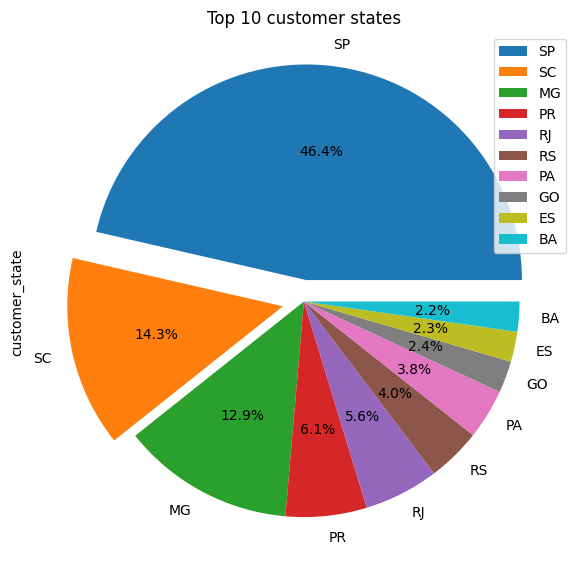

In [6]:
myexplode = [0.1, 0.1, 0, 0,0,0,0,0,0,0]
cd_df.customer_state.value_counts().sort_values(ascending=False).head(10).plot(kind = 'pie',figsize=(7,7),radius=1,labels=cd_df.customer_state.unique(),autopct='%.1f%%',explode=myexplode)
plt.title('Top 10 customer states')
plt.legend()
plt.show()

-  State SP has most number of counts **(46.4%)**
-  There are **41746** customers from State SP

### Top 10 cities with their value counts

In [7]:
cd_df.customer_city.value_counts().sort_values(ascending=False)[:10]

sao paulo                15540
rio de janeiro            6882
belo horizonte            2773
brasilia                  2131
curitiba                  1521
campinas                  1444
porto alegre              1379
salvador                  1245
guarulhos                 1189
sao bernardo do campo      938
Name: customer_city, dtype: int64

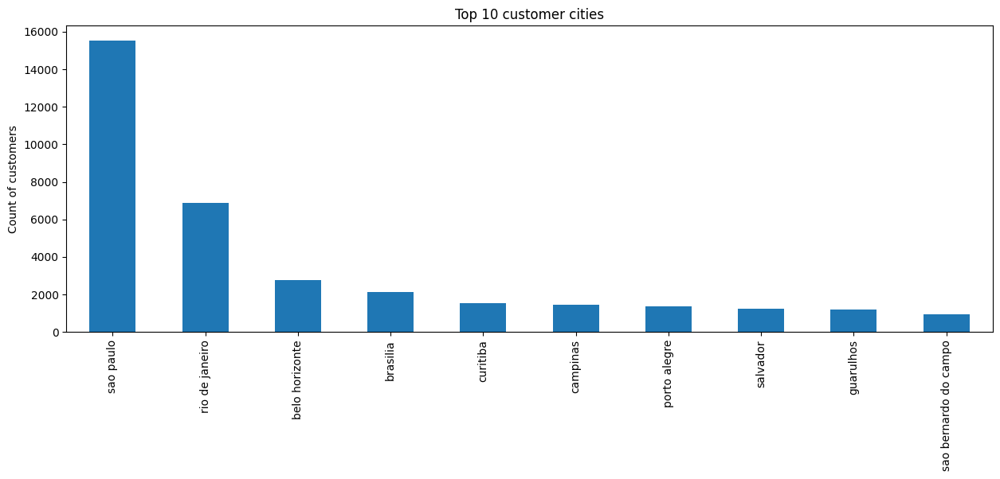

In [8]:
#top 10 customer cities with count
cd_df['customer_city'].value_counts().sort_values(ascending=False).head(10).plot(kind='bar', figsize=(15, 5))
plt.title('Top 10 customer cities')
plt.ylabel('Count of customers');

-  Cities **sao paulo & Rio de Janerio** has highest no. of customers with **15540  & 6882** respectively.
-  Sao bernardo do campo city has **938** customers.
-  The Range no. of customers from cities is **1100 - 2200**

In [9]:
print('Number of sellers :',oid_df.seller_id.unique().shape[0])
print('Number of unique products are : ',oid_df.product_id.unique().shape[0])

Number of sellers : 3095
Number of unique products are :  32951


- There are **3095** unique sellers and most of seller are in State **SP**.

### Most used Payment method for orders

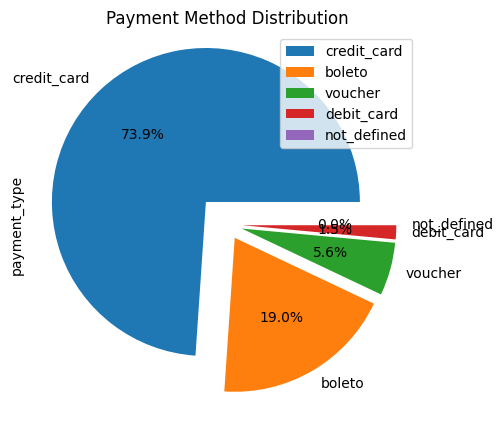

In [10]:
myexplode = [0.2, 0.1, 0.1, 0.1,0.1]
opd_df.payment_type.value_counts().plot(kind='pie',figsize=(5,5),radius=1,labels=opd_df.payment_type.unique(),autopct='%.1f%%',explode=myexplode)
plt.legend()
plt.title('Payment Method Distribution')
plt.show()

- Credit card is mostly used for transaction almost **74 %**.
- Debit card is least used with **1529** customers.

In [11]:
opd_df.payment_type.value_counts().sort_values(ascending=False)[:10]

credit_card    76795
boleto         19784
voucher         5775
debit_card      1529
not_defined        3
Name: payment_type, dtype: int64

###  Number of installments feature

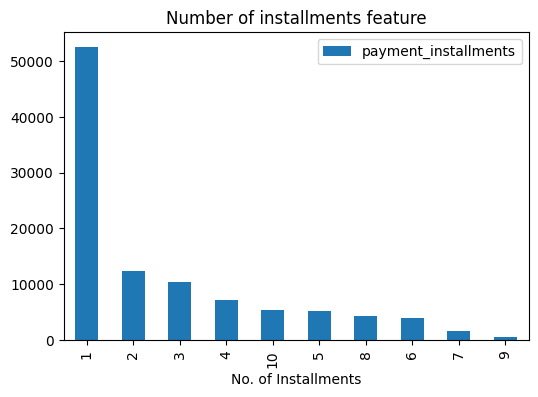

In [12]:
opd_df.payment_installments.value_counts().sort_values(ascending=False)[:10].plot(kind = 'bar',figsize=(6,4))
plt.legend()
plt.title('Number of installments feature')
plt.xlabel('No. of Installments')
plt.show()

-   No. of installments majority is 1, that is full payment was done. 
-   Otherwise it is not more than 4 in most of the cases.

### Pie chart for Review Score

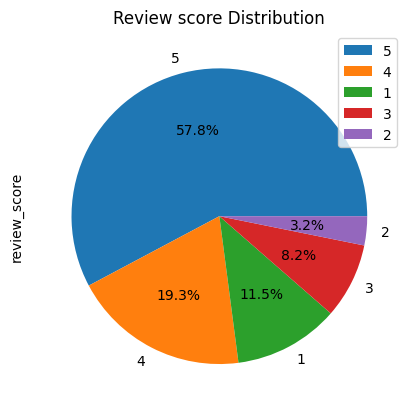

In [13]:
ord_df.review_score.value_counts().plot(kind = 'pie',radius=1,autopct='%.1f%%')
plt.legend()
plt.title('Review score Distribution')
plt.show()


-  Review score by maximum customers is 5 star (57.8%) and 4 star (19.3%)
-  Review_comment_title and review_comment_message have lots of entires as blank or null, which is a problem. This is however expected because most customers don't prefer to write reviews

### Order status

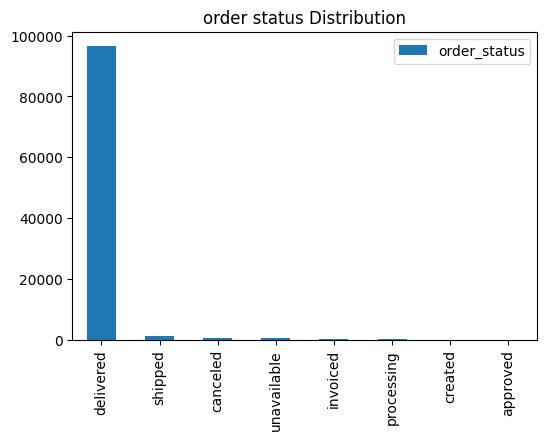

In [14]:
od_df.order_status.value_counts().plot(kind = 'bar',figsize=(6,4))
plt.legend()
plt.title('order status Distribution')
plt.show()

-  Almost 97% of orders are marked as delivered, No varies in the features.
-  Just 625 orders placed have been cancelled.

In [15]:
od_df.order_status.value_counts()

delivered      96478
shipped         1107
canceled         625
unavailable      609
invoiced         314
processing       301
created            5
approved           2
Name: order_status, dtype: int64

## Geograpical representation

In [16]:
gd_df.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


In [17]:
geo = gd_df.drop_duplicates(subset=None, keep='first', inplace=False)

In [18]:
centroid = geo.groupby('geolocation_zip_code_prefix').agg({
    'geolocation_lat': 'median',
    'geolocation_lng': 'median',
    'geolocation_city': pd.Series.mode
}).reset_index()
centroid['count'] = geo.groupby('geolocation_zip_code_prefix').size().reset_index(
    name='counts')['counts']

In [19]:
token = 'pk.eyJ1IjoiZmFhdGhpcjk4IiwiYSI6ImNrMGVxMTl5dzBiZHYzYm1wMm15b2RhcXQifQ.InHG7-SGeNMtnnfkvIVCRg'
fig = px.scatter_mapbox(centroid,
                        lat="geolocation_lat",
                        lon="geolocation_lng",
                        size="count",
                        color="count",
                        size_max=8,
                        color_continuous_scale=px.colors.sequential.Redor,
                        zoom=2.7)
fig.update_layout(mapbox_style="outdoors", mapbox_accesstoken=token)
fig.show()

# Geo Location Exploration
- At this section, i would like to explore the market and its customer in geological approach.
- **1) Market Distribution**
- Before we analyze the distribution of market location, we need to process the geo dataset. As we have seen from the dataset above, one zip_code_prefix may contain several different latitudes and longitudes. Since there is big amount of data, it would be better to group each zip code and define its langitude and longitude based on each zip code center as shown below. The count column define number of different position for each zip code.

In [20]:
gd_df.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


- Before going any further, it seems that geo dataset contain several duplicates. Therefore, we gonna need to drop it first.

In [21]:
geo = gd_df.drop_duplicates(subset=None, keep='first', inplace=False)

In [22]:
centroid = geo.groupby('geolocation_zip_code_prefix').agg({
    'geolocation_lat': 'median',
    'geolocation_lng': 'median',
    'geolocation_city': pd.Series.mode
}).reset_index()
centroid['count'] = geo.groupby('geolocation_zip_code_prefix').size().reset_index(
    name='counts')['counts']

- The following map are the distribution of the market at Brazil:

In [23]:
import plotly
import plotly.express as px

token = 'pk.eyJ1IjoiZmFhdGhpcjk4IiwiYSI6ImNrMGVxMTl5dzBiZHYzYm1wMm15b2RhcXQifQ.InHG7-SGeNMtnnfkvIVCRg'
fig = px.scatter_mapbox(centroid,
                        lat="geolocation_lat",
                        lon="geolocation_lng",
                        size="count",
                        color="count",
                        size_max=8,
                        color_continuous_scale=px.colors.sequential.Redor,
                        zoom=2.7)
fig.update_layout(mapbox_style="outdoors", mapbox_accesstoken=token)
fig.show()

- As we can see, the market distributed highly at south Brazil approximately around lat: -22 and lng: -46. Therefore, I suggest for the market distribution to be balanced. Moreover, if the company interested in expand the market to international, it is highly recommended to expand the market at north and west Brazil since there is only a few market around to focus on company's branding.

**2) Revenue Distribution**

- To explore the distribution of product revenue, we need to process the order dataset and clean the data from duplicate. However, the position for each order are contained on the geo dataset. Therefore, we need to join both dataset based on order id column.

In [24]:
od_df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [25]:
gd_df.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


In [26]:
ord_df.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


In [27]:
opd_df.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


In [28]:
oid_df.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [29]:
cd_df.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [30]:
order = pd.merge(od_df,cd_df,on='customer_id',how='left') 
order= pd.merge(order,oid_df, on='order_id',how="left")
order= pd.merge(order,opd_df, on='order_id',how="left")
order= pd.merge(order,ord_df, on='order_id',how="left")

In [31]:
order.shape

(119143, 28)

In [32]:
order.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,1.0,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,1.0,credit_card,1.0,18.12,a54f0611adc9ed256b57ede6b6eb5114,4.0,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,1.0,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,3.0,voucher,1.0,2.00,a54f0611adc9ed256b57ede6b6eb5114,4.0,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,1.0,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,2.0,voucher,1.0,18.59,a54f0611adc9ed256b57ede6b6eb5114,4.0,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48
3,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,1.0,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.70,22.76,1.0,boleto,1.0,141.46,8d5266042046a06655c8db133d120ba5,4.0,Muito boa a loja,Muito bom o produto.,2018-08-08 00:00:00,2018-08-08 18:37:50
4,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO,1.0,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,2018-08-13 08:55:23,159.90,19.22,1.0,credit_card,3.0,179.12,e73b67b67587f7644d5bd1a52deb1b01,5.0,NaN,NaN,2018-08-18 00:00:00,2018-08-22 19:07:58


In [33]:
order = order.drop_duplicates(subset=None, keep='first', inplace=False)

In [34]:
order.shape

(119143, 28)

In [35]:
geo_order = pd.merge(centroid,
                     order,
                     how='right',
                     left_on='geolocation_zip_code_prefix',
                     right_on='customer_zip_code_prefix')

In [36]:
geo_order.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,count,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,3149.0,-23.575816,-46.587303,sao paulo,16.0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,1.0,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,1.0,credit_card,1.0,18.12,a54f0611adc9ed256b57ede6b6eb5114,4.0,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48
1,3149.0,-23.575816,-46.587303,sao paulo,16.0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,1.0,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,3.0,voucher,1.0,2.00,a54f0611adc9ed256b57ede6b6eb5114,4.0,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48
2,3149.0,-23.575816,-46.587303,sao paulo,16.0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,1.0,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,2.0,voucher,1.0,18.59,a54f0611adc9ed256b57ede6b6eb5114,4.0,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48
3,47813.0,-12.126533,-45.008244,barreiras,14.0,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,1.0,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.70,22.76,1.0,boleto,1.0,141.46,8d5266042046a06655c8db133d120ba5,4.0,Muito boa a loja,Muito bom o produto.,2018-08-08 00:00:00,2018-08-08 18:37:50
4,75265.0,-16.744472,-48.514624,vianopolis,25.0,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO,1.0,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,2018-08-13 08:55:23,159.90,19.22,1.0,credit_card,3.0,179.12,e73b67b67587f7644d5bd1a52deb1b01,5.0,NaN,NaN,2018-08-18 00:00:00,2018-08-22 19:07:58


In [37]:
geo_order.shape

(119143, 33)

- Same as the previous part, the dataset is grouped by customer zip code and for each group contain the sum of value ordered products.

In [38]:
geo_rev = geo_order.groupby('customer_zip_code_prefix').agg({
    'geolocation_lat':'median',
    'geolocation_lng':'median',
    'payment_value':'sum'
}).reset_index()

- The following map are the distribution of the purchased procuts at Brazil:

In [39]:
import plotly.graph_objects as go
fig = go.Figure(
    go.Densitymapbox(lat=geo_rev.geolocation_lat,
                     lon=geo_rev.geolocation_lng,
                     z=geo_rev.payment_value,
                     radius=10))
fig.update_layout(mapbox_style="stamen-terrain",
                  mapbox_center_lon=-50,
                  mapbox_center_lat=-16,
                  mapbox_zoom=2.7)
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.show()

- As shown the map above, we can conclude there are three main hotspots which located at approximately:

- lat:-24, lng:-46
- lat:-22, lng:-43
- lat:-19, lng:-43
- These three places are the market with highest revenue. To raise company's revenue, it is highly recommended to add more market around these three hotspots since there's a lot of customer gladly spending their money there.

- **Conclusion**
- In this geological approach, there are a few things i would like to recommend:

- For branding expansion, it is best for the company to expand the market at the west and north Brazil. However, with low income from these location, it would be better to build only a few market for each city or area since the interest of the customer is currently low.
- For increase in revenue, it is best for the company to expand the market at these three hotspots:
- **lat:-23, lng:-46**
- **lat: -22, lng:-43**
- **lat: -19, lng:-43**
- Since these hotspots have highest number of customer and revenue, it shows that the customer around these hotspots interested with the market.

- **II. Time Period Exploration**

- At this section, I would like to explore the market and customer interest based on timing approach.

- 1) Accuracy of Delivery Estimation

- Analyzing the accuracy that company estimate for delivery time. Dividing the case when the delivery is late and early.

In [40]:
od_df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [41]:
od_df.shape

(99441, 8)

In [42]:
od_df.isna().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

In [43]:
od_df['order_delivered_customer_date'] = pd.to_datetime(od_df['order_delivered_customer_date'])
od_df['order_estimated_delivery_date'] = pd.to_datetime(od_df['order_estimated_delivery_date'])

-  Since the order can be canceled after the purchase, there are empty element on delivery date column. Therefore, we will drop the empty column.

In [44]:
od_df = od_df.dropna(subset=['order_delivered_customer_date'])

### Next, we will find the range time from the estimated delivery date and the delivery date, which measured on day.

In [45]:
od_df['range_time'] = (od_df['order_delivered_customer_date'] -
                       od_df['order_estimated_delivery_date']).astype('timedelta64[D]')

### Furthermore, we define which customer got the product early and delayed. Since we define it as time interval, we absolute the negative time on early variables.

In [46]:
od_df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,range_time
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,-8.0
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,-6.0
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,-18.0
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,-13.0
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,-10.0


In [47]:
od_df['range_time'].value_counts().nunique()

91

In [48]:
delay = od_df['range_time'][od_df['range_time'] > 0]
early = abs(od_df['range_time'][od_df['range_time'] < 0])

In [49]:
od_df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,range_time
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,-8.0
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,-6.0
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,-18.0
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,-13.0
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,-10.0


### *A. Early Delivery Exploration*


First, we divide the early dataset into five categories.

In [50]:
bins = [0, 3, 7, 14, 30, 90]
labels = [
    '1-3 days', '4-7 days', '7-14 days', '14-30 days', 'More than 1 month'
]
early = pd.cut(early, bins=bins, labels=labels)

In [51]:
early.value_counts()


7-14 days            36364
14-30 days           32589
4-7 days             12598
1-3 days              4743
More than 1 month     2350
Name: range_time, dtype: int64

In [52]:
delay.value_counts()


1.0      825
2.0      545
3.0      500
7.0      483
4.0      453
        ... 
91.0       1
123.0      1
83.0       1
67.0       1
110.0      1
Name: range_time, Length: 115, dtype: int64

### The following bar chart is the number of customer got an early delivery categorized by how long it is early.

<AxesSubplot: xlabel='count', ylabel='range_time'>

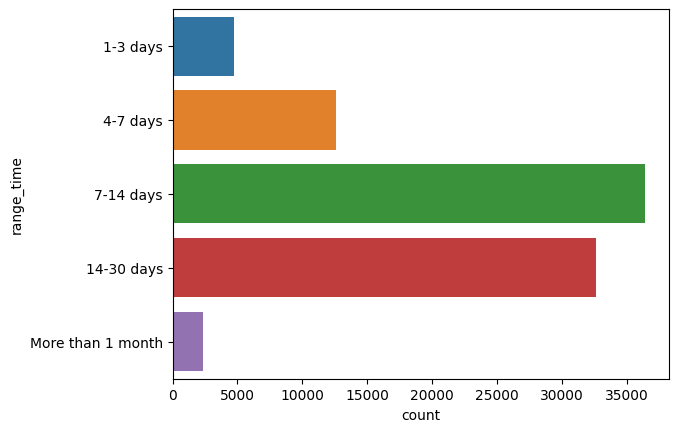

In [53]:
sns.countplot(y=early)

- Most early delivered orders were in between days **7-14**.
- **2350** Orders were delivered before a month which is good for company's reputation


### B) *Delay Delivery Estimation*

Same as the section above, we divide the delay dataset into five categories.

### The following bar chart is the number of customer got an delay delivery categorized by how long it is early.

<AxesSubplot: xlabel='count', ylabel='range_time'>

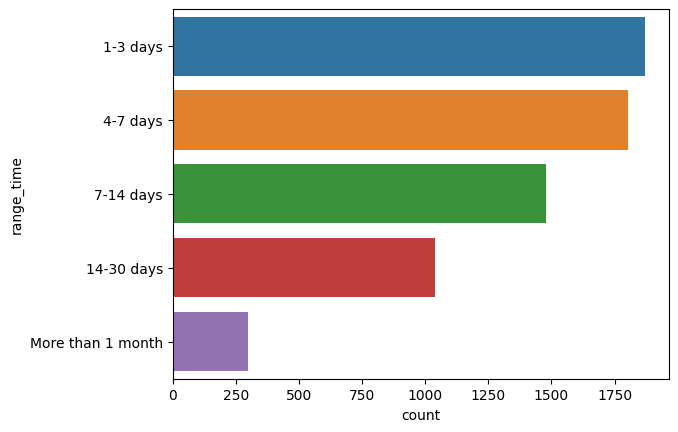

In [54]:
delay = pd.cut(delay, bins=bins, labels=labels)
sns.countplot(y=delay)

- The delivery delay mainly in **4-7** days and **1-3 days.**
- This is could be company consideration to check the delivery estimator, since there is a lot day customer in 4-7 days.
- Moreover, there are some delayed **delivery above 1 month**, this would **reduce customer satisfaction significanlly.**

### Next, we will see which location has high rates of delayed delivery. We will define delay has 1 if it is delayed and 0 if it is early

In [55]:
od_df['range_time_default'] = od_df['range_time'].apply(
    lambda x: 1 if x > 0 else 0)

In [56]:
od_df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,range_time,range_time_default
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,-8.0,0
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,-6.0,0
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,-18.0,0
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,-13.0,0
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,-10.0,0


- **0 : EARLY**
- **1 : DELAY**

In [57]:
od_df['range_time_default'].value_counts()

0    89941
1     6535
Name: range_time_default, dtype: int64

<AxesSubplot: >

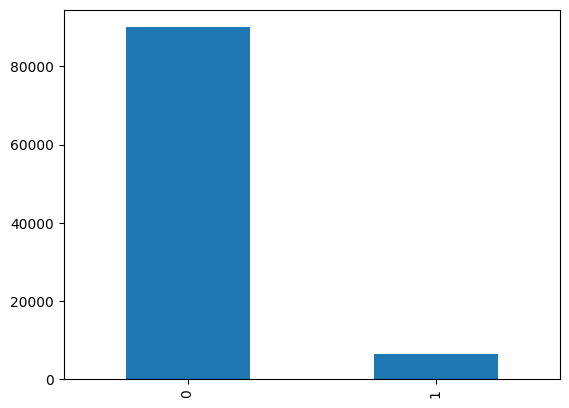

In [58]:
pd.value_counts(od_df['range_time_default']).plot.bar()

- There are **89941** early deliveries & **6535** delayed deliveries.

### Furthermore, we will group the dataset based on zip code and determine the center of each zip code with addition mean of range time default for each center zip code area.

In [59]:
geo_order = pd.merge(centroid,
                     cd_df,
                     how='right',
                     left_on='geolocation_zip_code_prefix',
                     right_on='customer_zip_code_prefix')

In [60]:
geo_order.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,count,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,14409.0,-20.502307,-47.396740,franca,126.0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,9790.0,-23.730435,-46.541474,sao bernardo do campo,125.0,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,1151.0,-23.531294,-46.656980,sao paulo,34.0,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,8775.0,-23.499025,-46.183436,mogi das cruzes,83.0,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,13056.0,-22.974331,-47.142173,campinas,131.0,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [61]:
geo_order.shape

(99441, 10)

In [62]:
df1=pd.merge(geo_order,od_df,how="right",left_on='customer_id',right_on='customer_id')

In [63]:
df1.shape

(96476, 19)

In [64]:
delay_place = df1.groupby('geolocation_zip_code_prefix').agg({
    'geolocation_lat':'median',
    'geolocation_lng':'median',
    'range_time_default':'mean'
})

### The following map plot show the high rate delayed delivery area. 

In [65]:
import plotly.graph_objects as go

fig = go.Figure(
    go.Densitymapbox(lat=delay_place.geolocation_lat,
                     lon=delay_place.geolocation_lng,
                     z=delay_place.range_time_default,
                     radius=10))
fig.update_layout(mapbox_style="open-street-map",   
                  mapbox_center_lon=-50,
                  mapbox_center_lat=-16,
                  mapbox_zoom=2.8)
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.show()

### As shown above, there are five hotspots with high rates of delayed delivery, which located at:


1.   lat:-22, lng:-43
2.   lat:-23, lng:-46
3.   lat:-8, lng:-35
4.   lat:-29, lng:-52
5.   lat:-12, lng:-38

These hotspots must be the company concern.

## *Conclusion of Time Exploration*
Below, is percentage of early, normal, and delay delivery. 

In [66]:
normal = od_df['range_time'][od_df['range_time'] == 0]
print('Normal:',round(normal.count() * 100 / od_df['range_time'].count(),3), '%',
      '\nEarly:',round(early.count() * 100 / od_df['range_time'].count(), 3), '%',
      '\nDelay:',round(delay.count() * 100 / od_df['range_time'].count(), 3), '%')

Normal: 1.339 % 
Early: 91.882 % 
Delay: 6.725 %


 As we can see, the number of exact the percentage on early product is very high, approximately 92,5%. 
 - High number of early delivery might satisfy the customer, but **shows inaccuracy of delivery time estimator**. 
 - Moreover, even if the delay percentage is low, this should be the company concern since there are some order that have **delayed delivery more than one month**. 
 - As an analyst, I strongly suggest the company to **improve the delivery time estimator** since only 1% of customer predicted accurately.
 ----------------------------------------------------------

# **Promotion Timing**

- This section will analyze the best time to promote company's product or to release new product. First, we change the purchase time data type to datetime type.

In [67]:
order['order_purchase_timestamp'] = pd.to_datetime(
    order['order_purchase_timestamp'])

**A. Best Hour**

- Next, we take only the hour part from the purchase time.

In [68]:
best_time_hours = (order.order_purchase_timestamp).dt.hour

In [69]:
#The following graph shows purchase time in hour.

<AxesSubplot: xlabel='order_purchase_timestamp', ylabel='Density'>

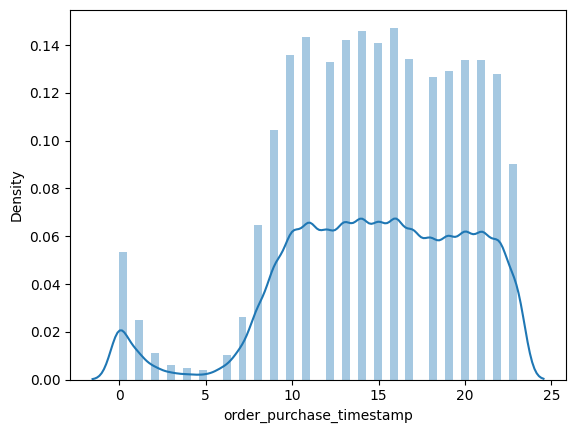

In [70]:
sns.distplot(best_time_hours)

- As shown above, most of the customers purchase products around 10 am until 22 pm.

**B. Best Day**

In [71]:
#At this part, we only take the day part from each purcahse date.

In [72]:
best_time_day = order.order_purchase_timestamp.apply(lambda x: x.weekday())

In [73]:
#The following graph shows purchase time in day.

<AxesSubplot: xlabel='order_purchase_timestamp', ylabel='Density'>

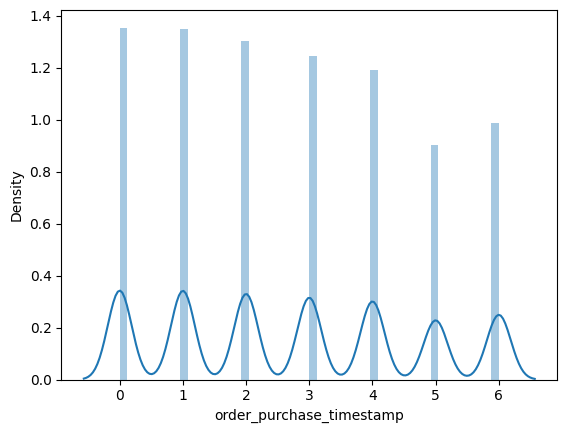

In [74]:
sns.distplot(best_time_day)

- As we can see, the highest number of purchase is on Tuesday(1), then Monday(0). However, even in other days the number of purchase not significanlly low, I recommend to avoid promote products in Saturday (5), since it is the lowest.

**C) Best Month**

In [75]:
#First, we only take the month part from each purchase date.

In [76]:
best_time_month = (order.order_purchase_timestamp).dt.month

In [77]:
#The following graph is the purchase time in month.

<AxesSubplot: xlabel='order_purchase_timestamp', ylabel='Density'>

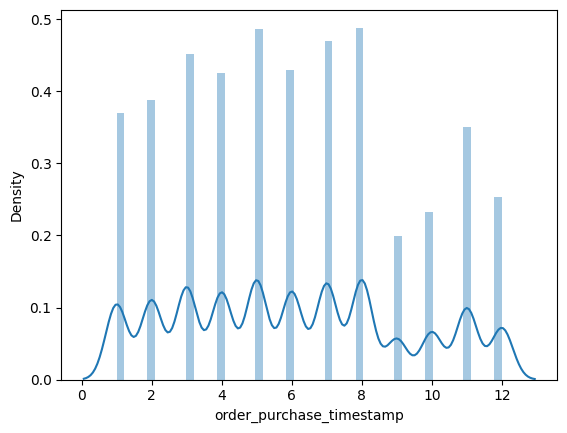

In [78]:
sns.distplot(best_time_month)

- As shown above, the highest number of purchase in August (8). However, even in other days the number of purchase not significanlly low, I recommend to avoid promote products in December (12), since it is the lowest.

- **Conclusion**
----------------------------------------------------------------
- Based on the previous analysis, I recommend the company to promote or release new products on:

- **Hour: Around 10 am - 22 pm**
- **Day: Tuesday, Monday**
- **Month: August, February**
- It might be okay to promote on another time besides the time I mentioned above, since it is not significanlly different. - However, there are some time with low number of purchase which the company should avoid:

- **Hour: Around 3 am - 5 am**
- **Day: Saturday**
- **Month: December, October**

--------------------------------------------------------------------------
- **IV. Product Exploration**

- At this section, we will explore the product from the market.

**1) Popularity Analysis**

- This section will focus on exploring the popularity of product. Before we analyze, let's take a look at product translation dataset.

In [79]:
order_trans = pd.merge(od_df, oid_df, on='order_id', how='left')
order_trans = pd.merge(order_trans,pd_df, on='product_id', how='inner')
order_trans = pd.merge(order_trans,opd_df, on='order_id', how = 'left')
order_trans = pd.merge(order_trans,ord_df, on='order_id', how='left')
order_trans = pd.merge(order_trans,cd_df, on='customer_id', how='right')
order_trans = pd.merge(order_trans,pt_df, on='product_category_name', how='inner')

In [80]:
order_trans.shape

(114061, 39)

In [81]:
order_en = order_trans.drop(['product_category_name'], axis=1)

In [82]:
order_en.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,range_time,range_time_default,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,product_category_name_english
0,00e7ee1b050b8499577073aeb2a297a1,06b8999e2fba1a1fbc88172c00ba8bc7,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,2017-05-25 10:35:35,2017-06-05,-11.0,0.0,1.0,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-05-22 15:22:12,124.99,21.88,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,1.0,credit_card,2.0,146.87,88b8b52d46df026a9d1ad2136a59b30b,4.0,NaN,NaN,2017-05-26 00:00:00,2017-05-30 22:34:40,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,office_furniture
1,b2059ed67ce144a36e2aa97d2c9e9ad2,4e7b3e00288586ebd08712fdd0374a03,delivered,2018-05-19 16:07:45,2018-05-20 16:19:10,2018-06-11 14:31:00,2018-06-14 17:58:51,2018-06-13,1.0,1.0,1.0,bd07b66896d6f1494f5b86251848ced7,7c67e1448b00f6e969d365cea6b010ab,2018-06-05 16:19:10,139.94,17.79,55.0,955.0,1.0,8267.0,52.0,52.0,17.0,1.0,credit_card,7.0,157.73,5ad6695d76ee186dc473c42706984d87,5.0,NaN,NaN,2018-06-15 00:00:00,2018-06-15 12:10:59,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,office_furniture
2,951670f92359f4fe4a63112aa7306eba,b2b6027bc5c5109e529d4dc6358b12c3,delivered,2018-03-13 16:06:38,2018-03-13 17:29:19,2018-03-27 23:22:42,2018-03-28 16:04:25,2018-04-10,-13.0,0.0,1.0,a5647c44af977b148e0a3a4751a09e2e,7c67e1448b00f6e969d365cea6b010ab,2018-03-27 16:31:16,149.94,23.36,48.0,1066.0,1.0,12160.0,56.0,51.0,28.0,1.0,credit_card,1.0,173.30,059a801bb31f6aab2266e672cab87bc5,5.0,NaN,NaN,2018-03-29 00:00:00,2018-04-02 18:36:47,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,office_furniture
3,997fd4b37386d10b57d4ac8cdec011a6,4c06b42fbf7b97ab10779cda5549cd1c,delivered,2018-07-08 09:59:19,2018-07-08 10:30:15,2018-07-25 15:12:00,2018-08-08 19:42:53,2018-08-16,-8.0,0.0,1.0,8ed094bfe076c568f6bb10feada3f75d,7c67e1448b00f6e969d365cea6b010ab,2018-07-26 10:30:15,199.98,115.77,43.0,1128.0,1.0,16133.0,63.0,59.0,25.0,1.0,credit_card,6.0,315.75,2518803238cabbf63564593e4a8fc52d,1.0,Nada de produto,"Ainda não recebi o produto. Sendo assim, não p...",2018-08-09 00:00:00,2018-08-14 11:40:54,07d190f123147d9e89d4b922543d7948,65075,sao luis,MA,office_furniture
4,b63fff1ef8b6201df68bb611ee41129e,8276de07ef25225d412b8462d73f8664,delivered,2017-04-02 22:15:27,2017-04-04 05:55:19,2017-04-13 16:28:06,2017-05-02 13:53:25,2017-05-08,-6.0,0.0,1.0,aba86c093ccdbac75b09111d57e50004,7c67e1448b00f6e969d365cea6b010ab,2017-04-17 05:55:19,129.60,16.61,41.0,154.0,1.0,2600.0,40.0,45.0,39.0,1.0,boleto,1.0,146.21,84467f1766775ba4c14fc25b3ca67905,4.0,NaN,"A crítica é à entrega, pois por se tratar dos ...",2017-05-03 00:00:00,2017-05-03 21:06:33,332cf4e83e16004ba7dca932ce82475b,90010,porto alegre,RS,office_furniture


- The following bar chart shows percentage of each rating for overall products

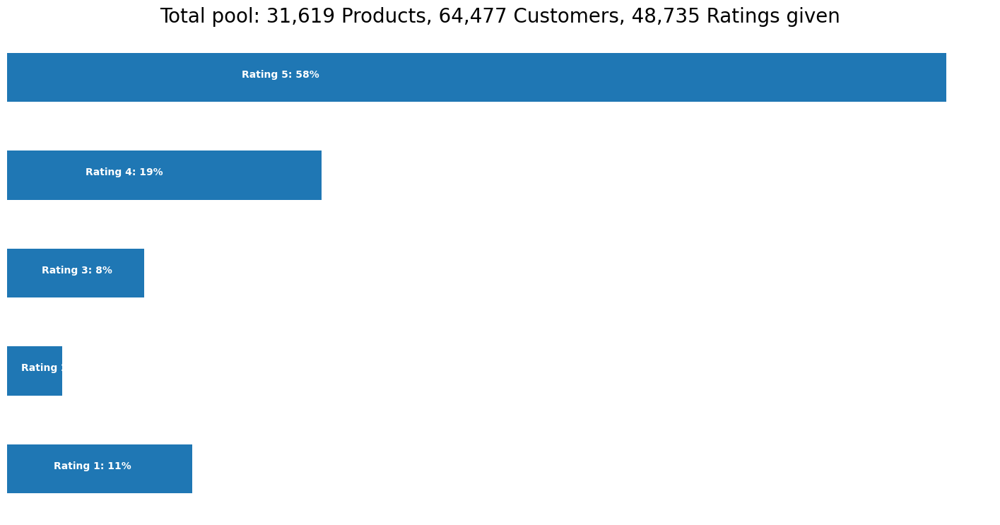

In [83]:
n = order_en.groupby('review_score')['review_score'].agg(['count'])

prod_count = order_en['product_id'].nunique()

cust_count = cd_df['customer_unique_id'].nunique() - prod_count

rating_count = order_en['review_score'].count() - cust_count

ax = n.plot(kind='barh', legend=False, figsize=(18,9))
plt.title(
    'Total pool: {:,} Products, {:,} Customers, {:,} Ratings given'.format(
        prod_count, cust_count, rating_count),
    fontsize=20)
plt.axis('off')

for i in range(1, 6):
    ax.text(n.iloc[i - 1][0] / 4,
            i - 1,
            'Rating {}: {:.0f}%'.format(i,
                                        n.iloc[i - 1][0] * 100 / n.sum()[0]),
            color='white',
            weight='bold')

- As we can see, it is actually excellent to have 58% of the products is rated 5. However, the rate 1: 11% percentage is quite high compared to rate 2 and 3.
- We'll take a look at the most popular product category, and we'll measure it by how many reviews has been submitted at each product category


In [84]:
pop_prod = pd.DataFrame(
    order_en.groupby('product_id')['review_score'].count())
most_popular = pop_prod.sort_values('review_score', ascending=False)
most_popular.head(10)

,review_score
product_id,
aca2eb7d00ea1a7b8ebd4e68314663af,526
422879e10f46682990de24d770e7f83d,507
99a4788cb24856965c36a24e339b6058,507
389d119b48cf3043d311335e499d9c6b,402
368c6c730842d78016ad823897a372db,395
53759a2ecddad2bb87a079a1f1519f73,389
d1c427060a0f73f6b889a5c7c61f2ac4,344
53b36df67ebb7c41585e8d54d6772e08,323
154e7e31ebfa092203795c972e5804a6,286


- It would be easier if we show it in the bar chart, as shown below.

<AxesSubplot: ylabel='product_id'>

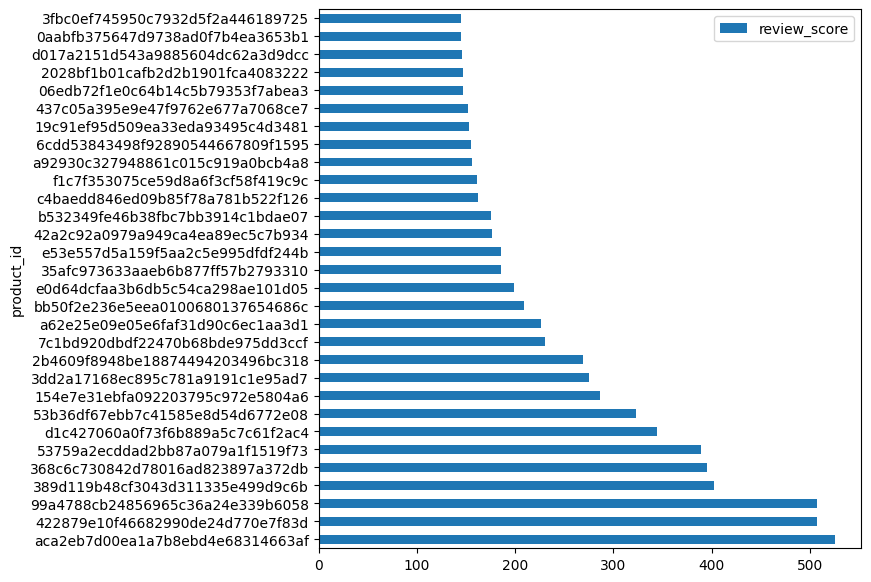

In [85]:
plt.rcParams['figure.figsize'] = (7,7)
most_popular.head(30).plot(kind="barh")

- From the bar chart above, we can conclude that product with product id: 'aca2eb7d00eala7b8ebd4e68314663af' is the most popular. This product has highest review score, this score may be different for each person (might be high or low). However, we only focus on how many people reviewing this product since the score indicate the popularity

**Conclusion**


- We can conclude from this analysis that product id: 'aca2eb7d00eala7b8ebd4e68314663af' is the most popular product. I recommend for the company to:

- Not promote this popular product frequently since it is already popular

- Promote another product with low score of rating to attract customer with the product.
_____________________________________________________________

# **- Main Focus: Product Recommendation System**

- At this section, we want to make a recommendation system for the product. If we input a product ID number, this system will recomend product for this customer. First, we gonna look at the order dataset.

In [86]:
#We only need particular columns, so we slice the dataset and define new dataset as order_rating.

In [87]:
order_rating = order_en.loc[:, ['customer_id', 'product_id', 'review_score']]

In [88]:
order_rating = order_rating[order_rating['product_id'].isin(
    order_rating['product_id'].value_counts()[
        order_rating['product_id'].value_counts() > 10].index)]

In [89]:
order_rating = order_rating.reset_index()

- Moreover, we want to make a matrix between customers and products, and it will have score if the customer give review to particular products. The following is the matrix between customers and products.

In [90]:
ratings_utility_matrix = order_rating.pivot_table(values='review_score',
                                                  index='customer_id',
                                                  columns='product_id',
                                                  fill_value=0)
#ratings_utility_matrix.head()

In [91]:
#As we can see, the shape of the matrix is quite big.

In [92]:
ratings_utility_matrix.shape

(41483, 1769)

In [93]:
#For easier analysis, we want to transpose the matrix and we can see the size below.

In [94]:
X = ratings_utility_matrix.T
#X.head()

In [95]:
X.shape

(1769, 41483)

- Next, I am going to define a function to build a recommendation system. This function will fit the data into the model. This function build using the truncated SVD matrix reducing the components to 10. This function output will be a correlation matrix for product pairwisely.

In [96]:
from sklearn.decomposition import TruncatedSVD

In [97]:
def fitsystemrecommendation(ratings_utility_matrix):
    X = ratings_utility_matrix.T
    SVD = TruncatedSVD(n_components=10)
    decomposed_matrix = SVD.fit_transform(X)
    correlation_matrix = np.corrcoef(decomposed_matrix)
    return correlation_matrix

- Next, I am gonna fit the matrix i have transpose before to fitsystemreccomention function.

In [98]:
correlation_matrix = fitsystemrecommendation(ratings_utility_matrix)

- Moreover, I am gonna build a system recommendation function by inputing the product id, and this function will locate the first index found. Next, the function will show you the product that have high correlation with this product.

In [99]:
def systemrecommendation(prod_id):
    order_rating.index[order_rating['product_id'] == prod_id].tolist()[1]
    product_names = list(X.index)
    product_ID = product_names.index(prod_id)
    correlation_product_ID = correlation_matrix[product_ID]
    Recommend = list(X.index[correlation_product_ID > 0.70])
    Recommend.remove(prod_id)
    return pd.DataFrame(Recommend[0:9], columns=['Recommendation'])

- For example, the following program show you the recommendation if you buy product with product id: '99a4788cb24856965c36a24e339b6058'.

In [101]:
systemrecommendation('001b72dfd63e9833e8c02742adf472e3')

,Recommendation
0,0b0172eb0fd18479d29c3bc122c058c2
1,0fe922b7f7d43ef454bbc241416e7401
2,14555ba663de8689feacf1d0819cc3b3
3,163da86e86f0089de089399c28c3fcbb
4,16bf176650a888512655cc94f61860e3
5,16ce899c7af0c99f46948734a0d00f0f
6,187e7d92b8168c3661824809d0c5dffb
7,1bfe62f326ac7bec0f5a83c10cfff228
8,1c21c1ed398eae61184065889ca3d4b0


- We can see the recommendation when we input **product id: '001b72dfd63e9833e8c02742adf472e3'**. By using the function I have defined, this recommendation have high correlation with the product. Therefore, I suggest the company to promote this recommendation product when the product inputted is purchased of viewed.

- **Conclusion**
This recommendation system can be used by the company to promote the recommended product after the user purchase or interested with the currently viewed product. By conduct this kind of promotion, your company does not randomly promote product. On the other hand, the product promoted has high correlation. Therefore, the customer may purchased more since interest product appeared frequently.
--------------------------------------------------------

# *Sentiment Analysis*

In [102]:
rdf.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,review_english
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,18-01-2018 00:00,18-01-2018 21:46,NaN
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,10-03-2018 00:00,11-03-2018 03:05,NaN
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,17-02-2018 00:00,18-02-2018 14:36,NaN
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,21-04-2017 00:00,21-04-2017 22:02,I received well before the deadline.
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,01-03-2018 00:00,02-03-2018 10:26,Congratulations Lannister Stores I loved buyin...


In [103]:
review_data  = rdf.dropna()

In [104]:
review_data.shape

(9823, 8)

- **Tokenizing the words**
- **Converting Cases**
- **Removing Stopwords**

In [105]:
comments = []
stop_words = set(stopwords.words('english'))


for words in review_data['review_english']:
    only_letters = re.sub("[^a-zA-Z]", " ",words)
    tokens = nltk.word_tokenize(only_letters) #tokenize the sentences
    lower_case = [l.lower() for l in tokens] #convert all letters to lower case
    filtered_result = list(filter(lambda l: l not in stop_words, lower_case)) #Remove stopwords from the comments
    comments.append(' '.join(filtered_result))

- **CountVectorizer**

In [106]:
# Using CountVectorizer to get the most important trigrams
co = CountVectorizer(ngram_range=(3,3))
counts = co.fit_transform(comments)
important_trigrams = pd.DataFrame(counts.sum(axis=0),columns=co.get_feature_names_out()).T.sort_values(0,ascending=False).head(25)

In [107]:
important_trigrams.head(25)

,0
product delivered time,94
product arrived deadline,87
super fast delivery,82
product delivered deadline,72
arrived well deadline,69
good quality product,53
product arrived well,48
product great quality,46
arrived earlier expected,42
product arrived time,39


Observations
1. From the **trigrams** above, we can safely say that most of the **customers were satisfied** with the delivery service, some others were highly satisfied with the products quality.
2. However, there are others who were not satisfied with the services rendered and we would like to investigate this anomaly further.

In [108]:
rdf.shape

(99224, 8)

- **Stemming**

In [109]:
default_stemmer = PorterStemmer()
default_stopwords = stopwords.words(
    'english')  # or any other list of your choice


def clean_text(text, ):
    def tokenize_text(text):
        return [w for s in sent_tokenize(text) for w in word_tokenize(s)]

    def remove_special_characters(text,
                                  characters=string.punctuation.replace(
                                      '-', '')):
        tokens = tokenize_text(text)
        pattern = re.compile('[{}]'.format(re.escape(characters)))
        return ' '.join(filter(None, [pattern.sub('', t) for t in tokens]))

    def remove_stopwords(text, stop_words=default_stopwords):
        tokens = [w for w in tokenize_text(text) if w not in stop_words]
        return ' '.join(tokens)

    text = text.strip(' ')  # strip whitespaces
    text = text.lower()  # lowercase
    text = remove_special_characters(text)  # remove punctuation and symbols
    #text.strip(' ') # strip whitespaces again?

    return text

In [110]:
def isNaN(num):
    return num != num


def sentimen_en(text):
    if isNaN(text) == True:
        return np.nan
    else:
        hasil = TextBlob(text).sentiment[0]
        return hasil

In [111]:
rdf['sentimen'] = rdf['review_english'].apply(lambda x: sentimen_en(x))

In [112]:
rdf

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,review_english,sentimen
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,18-01-2018 00:00,18-01-2018 21:46,NaN,NaN
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,10-03-2018 00:00,11-03-2018 03:05,NaN,NaN
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,17-02-2018 00:00,18-02-2018 14:36,NaN,NaN
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,21-04-2017 00:00,21-04-2017 22:02,I received well before the deadline.,0.000000
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,01-03-2018 00:00,02-03-2018 10:26,Congratulations Lannister Stores I loved buyin...,0.666667
...,...,...,...,...,...,...,...,...,...
99219,574ed12dd733e5fa530cfd4bbf39d7c9,2a8c23fee101d4d5662fa670396eb8da,5,NaN,NaN,07-07-2018 00:00,14-07-2018 17:18,NaN,NaN
99220,f3897127253a9592a73be9bdfdf4ed7a,22ec9f0669f784db00fa86d035cf8602,5,NaN,NaN,09-12-2017 00:00,11-12-2017 20:06,NaN,NaN
99221,b3de70c89b1510c4cd3d0649fd302472,55d4004744368f5571d1f590031933e4,5,NaN,"Excelente mochila, entrega super rápida. Super...",22-03-2018 00:00,23-03-2018 09:10,"Excellent backpack, super fast delivery. Super...",0.487500
99222,1adeb9d84d72fe4e337617733eb85149,7725825d039fc1f0ceb7635e3f7d9206,4,NaN,NaN,01-07-2018 00:00,02-07-2018 12:59,NaN,NaN


In [113]:
mask = rdf['review_english'].apply(lambda x: not isNaN(x))

In [114]:
rdf[mask][['review_english', 'sentimen']].sample(10)

,review_english,sentimen
95298,Missed 1 towel game ... 😠,-0.400
40780,"The delivery occurred on time, despite the fri...",-0.100
26717,Top,0.500
26057,"I haven't used the product yet, I arrived seal...",0.375
53899,Very good.,0.910
52108,Almost everything perfect ..\nDespite being de...,1.000
3197,"The product was not delivered, I try to talk t...",0.000
57753,I bought two products and received only one.,0.000
3623,The product is counterfeit. It did not come wi...,0.000
53013,Great product and delivery,0.800


## We can see below the score of each comment from -1 to 1.

In [115]:
bins = [-1, -0.1, 0.1, 1]
labels = ['negative', 'unsure', 'positive']
rdf['sentimen_label'] = pd.cut(rdf['sentimen'], bins=bins, labels=labels)

In [116]:
rdf[mask].groupby('sentimen_label').apply(lambda x: x.sample(10))[['review_english', 'sentimen']]

review_english  \
sentimen_label                                                            
negative       51670  The product has nothing to do with the color I...   
               48907  I confess that I was afraid not to know the pa...   
               65344                          The product for small car   
               92488                                 Very weak material   
               51253                               Poor partners of you   
               32710             The product came with the broken table   
               94284  I thought the curtain is very thin, it is all ...   
               16965  I bought a Consul conditioning air control and...   
               31811                    Product within what I expected.   
               28868  I had a problem in the form of payment, accord...   
unsure         48564                   I haven't received the goods yet   
               35289     Delivered on time, product packaged correctly.   
               22867  I can't evaluate because I haven't received it...   
               21805                        Very fast, in the expected.   
               84413  Initially, on the date of purchase the product...   
               48411  It arrived from the deadline, but the curtain ...   
               58818                           It worked in Punto 2014.   
               84304                                            Regular   
               38719                    I received long before expected   
               89393                           Product as announced !!!   
positive       81299                      It was all received perfectly   
               72599                           The product is very good   
               47607                     Good product, arrived on time.   
               18842                      Cute practical super indicate   
               53116                                          Very good   
               12066  Good product, identical to the photo, deliver ...   
               84315  Loved it. Cats are not peeing where I put the ...   
               94246  Beautiful glasses, it arrived in perfect condi...   
               87053                                               Good   
               28306  More than 30 days to deliver.\nAnd they didn't...   

                      sentimen  
sentimen_label                  
negative       51670 -0.250000  
               48907 -0.175000  
               65344 -0.250000  
               92488 -0.487500  
               51253 -0.400000  
               32710 -0.400000  
               94284 -0.520000  
               16965 -0.100000  
               31811 -0.100000  
               28868 -0.366667  
unsure         48564  0.000000  
               35289  0.000000  
               22867  0.000000  
               21805  0.080000  
               84413  0.000000  
               48411 -0.067708  
               58818  0.000000  
               84304  0.000000  
               38719 -0.075000  
               89393  0.000000  
positive       81299  1.000000  
               72599  0.910000  
               47607  0.700000  
               18842  0.416667  
               53116  0.910000  
               12066  0.700000  
               84315  0.700000  
               94246  0.925000  
               87053  0.700000  
               28306  0.500000

In [117]:
rdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   review_id                99224 non-null  object  
 1   order_id                 99224 non-null  object  
 2   review_score             99224 non-null  int64   
 3   review_comment_title     11566 non-null  object  
 4   review_comment_message   40968 non-null  object  
 5   review_creation_date     99224 non-null  object  
 6   review_answer_timestamp  99224 non-null  object  
 7   review_english           40929 non-null  object  
 8   sentimen                 40929 non-null  float64 
 9   sentimen_label           40838 non-null  category
dtypes: category(1), float64(1), int64(1), object(7)
memory usage: 6.9+ MB


In [118]:
rdf['sentimen_label'].value_counts()


positive    21897
unsure      15023
negative     3918
Name: sentimen_label, dtype: int64

<AxesSubplot: >

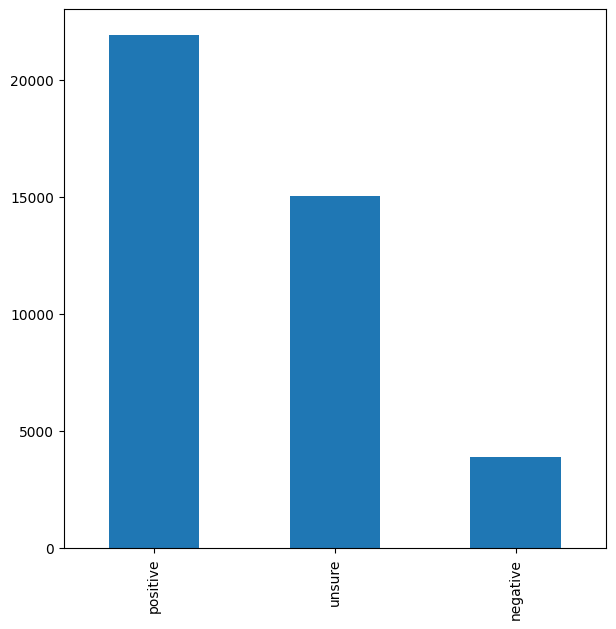

In [119]:
pd.value_counts(rdf['sentimen_label']).plot.bar()

- Among total review comments there are **3918** negative comments
- **15023** Reviews by customers are unsured

In [120]:
# rdf.to_csv(r"C:\Users\Anik8\Desktop\Ecommerce\sentiment.csv",header=True,index=False)

# *Conclusion of sentiment analysis*

By analyzing the sentiment of the comment, this can be the company consideration to improve their market.After recommend for the company to:
- Take a look at the **quality of the product** since it is the most customer concern
- Check your **delivery performence** since it is the second most customer concern
- Pay attention on the **store**, it may has **problems** since the customer mentioned it frequently. 

## Merging

In [121]:
df = pd.merge(od_df, oid_df, on='order_id', how='left')
df = pd.merge(df,pd_df, on='product_id', how='inner')
df = pd.merge(df,opd_df, on='order_id', how = 'left')
df = pd.merge(df,ord_df, on='order_id', how='left')
df = pd.merge(df,cd_df, on='customer_id', how='right')
df = pd.merge(df,pt_df, on='product_category_name', how='inner')

## Data preprocessing

In [122]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 114061 entries, 0 to 114060
Data columns (total 39 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   order_id                       114061 non-null  object        
 1   customer_id                    114061 non-null  object        
 2   order_status                   114061 non-null  object        
 3   order_purchase_timestamp       114061 non-null  object        
 4   order_approved_at              114047 non-null  object        
 5   order_delivered_carrier_date   114060 non-null  object        
 6   order_delivered_customer_date  114061 non-null  datetime64[ns]
 7   order_estimated_delivery_date  114061 non-null  datetime64[ns]
 8   range_time                     114061 non-null  float64       
 9   range_time_default             114061 non-null  float64       
 10  order_item_id                  114061 non-null  float64       
 11  

In [123]:
df.isna().sum()

order_id                              0
customer_id                           0
order_status                          0
order_purchase_timestamp              0
order_approved_at                    14
order_delivered_carrier_date          1
order_delivered_customer_date         0
order_estimated_delivery_date         0
range_time                            0
range_time_default                    0
order_item_id                         0
product_id                            0
seller_id                             0
shipping_limit_date                   0
price                                 0
freight_value                         0
product_category_name                 0
product_name_lenght                   0
product_description_lenght            0
product_photos_qty                    0
product_weight_g                      1
product_length_cm                     1
product_height_cm                     1
product_width_cm                      1
payment_sequential                    3


In [124]:
df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,range_time,range_time_default,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,product_category_name_english
0,00e7ee1b050b8499577073aeb2a297a1,06b8999e2fba1a1fbc88172c00ba8bc7,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,2017-05-25 10:35:35,2017-06-05,-11.0,0.0,1.0,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-05-22 15:22:12,124.99,21.88,moveis_escritorio,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,1.0,credit_card,2.0,146.87,88b8b52d46df026a9d1ad2136a59b30b,4.0,NaN,NaN,2017-05-26 00:00:00,2017-05-30 22:34:40,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,office_furniture
1,b2059ed67ce144a36e2aa97d2c9e9ad2,4e7b3e00288586ebd08712fdd0374a03,delivered,2018-05-19 16:07:45,2018-05-20 16:19:10,2018-06-11 14:31:00,2018-06-14 17:58:51,2018-06-13,1.0,1.0,1.0,bd07b66896d6f1494f5b86251848ced7,7c67e1448b00f6e969d365cea6b010ab,2018-06-05 16:19:10,139.94,17.79,moveis_escritorio,55.0,955.0,1.0,8267.0,52.0,52.0,17.0,1.0,credit_card,7.0,157.73,5ad6695d76ee186dc473c42706984d87,5.0,NaN,NaN,2018-06-15 00:00:00,2018-06-15 12:10:59,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,office_furniture
2,951670f92359f4fe4a63112aa7306eba,b2b6027bc5c5109e529d4dc6358b12c3,delivered,2018-03-13 16:06:38,2018-03-13 17:29:19,2018-03-27 23:22:42,2018-03-28 16:04:25,2018-04-10,-13.0,0.0,1.0,a5647c44af977b148e0a3a4751a09e2e,7c67e1448b00f6e969d365cea6b010ab,2018-03-27 16:31:16,149.94,23.36,moveis_escritorio,48.0,1066.0,1.0,12160.0,56.0,51.0,28.0,1.0,credit_card,1.0,173.30,059a801bb31f6aab2266e672cab87bc5,5.0,NaN,NaN,2018-03-29 00:00:00,2018-04-02 18:36:47,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,office_furniture
3,997fd4b37386d10b57d4ac8cdec011a6,4c06b42fbf7b97ab10779cda5549cd1c,delivered,2018-07-08 09:59:19,2018-07-08 10:30:15,2018-07-25 15:12:00,2018-08-08 19:42:53,2018-08-16,-8.0,0.0,1.0,8ed094bfe076c568f6bb10feada3f75d,7c67e1448b00f6e969d365cea6b010ab,2018-07-26 10:30:15,199.98,115.77,moveis_escritorio,43.0,1128.0,1.0,16133.0,63.0,59.0,25.0,1.0,credit_card,6.0,315.75,2518803238cabbf63564593e4a8fc52d,1.0,Nada de produto,"Ainda não recebi o produto. Sendo assim, não p...",2018-08-09 00:00:00,2018-08-14 11:40:54,07d190f123147d9e89d4b922543d7948,65075,sao luis,MA,office_furniture
4,b63fff1ef8b6201df68bb611ee41129e,8276de07ef25225d412b8462d73f8664,delivered,2017-04-02 22:15:27,2017-04-04 05:55:19,2017-04-13 16:28:06,2017-05-02 13:53:25,2017-05-08,-6.0,0.0,1.0,aba86c093ccdbac75b09111d57e50004,7c67e1448b00f6e969d365cea6b010ab,2017-04-17 05:55:19,129.60,16.61,moveis_escritorio,41.0,154.0,1.0,2600.0,40.0,45.0,39.0,1.0,boleto,1.0,146.21,84467f1766775ba4c14fc25b3ca67905,4.0,NaN,"A crítica é à entrega, pois por se tratar dos ...",2017-05-03 00:00:00,2017-05-03 21:06:33,332cf4e83e16004ba7dca932ce82475b,90010,porto alegre,RS,office_furniture


In [125]:
df.shape

(114061, 39)

- As our target is RFM Analysis , we will drop unnecessary columns

In [126]:
#dropping unused columns
df_clean = df.drop(columns=['order_status', 'order_approved_at', 
'order_delivered_customer_date', 'order_delivered_carrier_date','order_delivered_customer_date', 
'order_estimated_delivery_date', 'seller_id', 'shipping_limit_date','product_category_name', 
'product_name_lenght', 'product_description_lenght', 'product_weight_g', 'product_length_cm', 
'product_height_cm', 'product_width_cm', 'payment_installments','review_id', 'review_comment_title', 
'review_comment_message', 'review_creation_date', 'review_answer_timestamp', 'customer_id', 
'customer_city', 'customer_state', 'product_photos_qty', 'freight_value', 'payment_sequential'])

In [127]:
df_clean.head()

,order_id,order_purchase_timestamp,range_time,range_time_default,order_item_id,product_id,price,payment_type,payment_value,review_score,customer_unique_id,customer_zip_code_prefix,product_category_name_english
0,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,-11.0,0.0,1.0,a9516a079e37a9c9c36b9b78b10169e8,124.99,credit_card,146.87,4.0,861eff4711a542e4b93843c6dd7febb0,14409,office_furniture
1,b2059ed67ce144a36e2aa97d2c9e9ad2,2018-05-19 16:07:45,1.0,1.0,1.0,bd07b66896d6f1494f5b86251848ced7,139.94,credit_card,157.73,5.0,060e732b5b29e8181a18229c7b0b2b5e,1151,office_furniture
2,951670f92359f4fe4a63112aa7306eba,2018-03-13 16:06:38,-13.0,0.0,1.0,a5647c44af977b148e0a3a4751a09e2e,149.94,credit_card,173.30,5.0,259dac757896d24d7702b9acbbff3f3c,8775,office_furniture
3,997fd4b37386d10b57d4ac8cdec011a6,2018-07-08 09:59:19,-8.0,0.0,1.0,8ed094bfe076c568f6bb10feada3f75d,199.98,credit_card,315.75,1.0,07d190f123147d9e89d4b922543d7948,65075,office_furniture
4,b63fff1ef8b6201df68bb611ee41129e,2017-04-02 22:15:27,-6.0,0.0,1.0,aba86c093ccdbac75b09111d57e50004,129.60,boleto,146.21,4.0,332cf4e83e16004ba7dca932ce82475b,90010,office_furniture


In [128]:
# df_clean.to_csv(r"C:\Users\Anik8\Desktop\Ecommerce\merge.csv",header=True,index=False)

In [129]:
df_clean.shape

(114061, 13)

In [130]:
df_clean.isna().sum()

order_id                           0
order_purchase_timestamp           0
range_time                         0
range_time_default                 0
order_item_id                      0
product_id                         0
price                              0
payment_type                       3
payment_value                      3
review_score                     849
customer_unique_id                 0
customer_zip_code_prefix           0
product_category_name_english      0
dtype: int64

In [131]:
df_clean.duplicated().sum()


1049

In [132]:
#dropping duplicates value
df_clean = df_clean.drop_duplicates()


In [133]:
#dropping missing values
df_clean.dropna(inplace = True)

In [134]:
# df_clean.to_csv(r"C:\Users\Anik8\Desktop\Ecommerce\Ecom_merge.csv",header=True,index=False)

In [135]:
df_clean.duplicated().sum()


0

In [136]:
df_clean.isna().sum()

order_id                         0
order_purchase_timestamp         0
range_time                       0
range_time_default               0
order_item_id                    0
product_id                       0
price                            0
payment_type                     0
payment_value                    0
review_score                     0
customer_unique_id               0
customer_zip_code_prefix         0
product_category_name_english    0
dtype: int64

In [137]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 112163 entries, 0 to 114060
Data columns (total 13 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   order_id                       112163 non-null  object 
 1   order_purchase_timestamp       112163 non-null  object 
 2   range_time                     112163 non-null  float64
 3   range_time_default             112163 non-null  float64
 4   order_item_id                  112163 non-null  float64
 5   product_id                     112163 non-null  object 
 6   price                          112163 non-null  float64
 7   payment_type                   112163 non-null  object 
 8   payment_value                  112163 non-null  float64
 9   review_score                   112163 non-null  float64
 10  customer_unique_id             112163 non-null  object 
 11  customer_zip_code_prefix       112163 non-null  int64  
 12  product_category_name_english 

In [138]:
df_clean.shape

(112163, 13)

## changing to datetime

In [139]:
df_clean['order_purchase_timestamp'] = pd.to_datetime(df_clean['order_purchase_timestamp'])
df_clean['order_purchase_timestamp'].dt.strftime('%Y-%m-%d')

0         2017-05-16
1         2018-05-19
2         2018-03-13
3         2018-07-08
4         2017-04-02
             ...    
114056    2018-03-07
114057    2017-05-17
114058    2017-10-08
114059    2017-01-26
114060    2017-09-17
Name: order_purchase_timestamp, Length: 112163, dtype: object

In [140]:
df_clean.dtypes

order_id                                 object
order_purchase_timestamp         datetime64[ns]
range_time                              float64
range_time_default                      float64
order_item_id                           float64
product_id                               object
price                                   float64
payment_type                             object
payment_value                           float64
review_score                            float64
customer_unique_id                       object
customer_zip_code_prefix                  int64
product_category_name_english            object
dtype: object

## creating new columns to year,month and day

In [141]:
df_clean['month_order'] = df_clean['order_purchase_timestamp'].dt.month_name()
df_clean['weekday_order'] = df_clean['order_purchase_timestamp'].dt.day_name()
df_clean['month_year_order'] = df_clean['order_purchase_timestamp'].dt.to_period('M').astype(str)
df_clean['date_order'] = df_clean['order_purchase_timestamp'].dt.day


In [142]:
df_clean.head()

,order_id,order_purchase_timestamp,range_time,range_time_default,order_item_id,product_id,price,payment_type,payment_value,review_score,customer_unique_id,customer_zip_code_prefix,product_category_name_english,month_order,weekday_order,month_year_order,date_order
0,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,-11.0,0.0,1.0,a9516a079e37a9c9c36b9b78b10169e8,124.99,credit_card,146.87,4.0,861eff4711a542e4b93843c6dd7febb0,14409,office_furniture,May,Tuesday,2017-05,16
1,b2059ed67ce144a36e2aa97d2c9e9ad2,2018-05-19 16:07:45,1.0,1.0,1.0,bd07b66896d6f1494f5b86251848ced7,139.94,credit_card,157.73,5.0,060e732b5b29e8181a18229c7b0b2b5e,1151,office_furniture,May,Saturday,2018-05,19
2,951670f92359f4fe4a63112aa7306eba,2018-03-13 16:06:38,-13.0,0.0,1.0,a5647c44af977b148e0a3a4751a09e2e,149.94,credit_card,173.30,5.0,259dac757896d24d7702b9acbbff3f3c,8775,office_furniture,March,Tuesday,2018-03,13
3,997fd4b37386d10b57d4ac8cdec011a6,2018-07-08 09:59:19,-8.0,0.0,1.0,8ed094bfe076c568f6bb10feada3f75d,199.98,credit_card,315.75,1.0,07d190f123147d9e89d4b922543d7948,65075,office_furniture,July,Sunday,2018-07,8
4,b63fff1ef8b6201df68bb611ee41129e,2017-04-02 22:15:27,-6.0,0.0,1.0,aba86c093ccdbac75b09111d57e50004,129.60,boleto,146.21,4.0,332cf4e83e16004ba7dca932ce82475b,90010,office_furniture,April,Sunday,2017-04,2


In [143]:
df_clean.shape

(112163, 17)

In [144]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 112163 entries, 0 to 114060
Data columns (total 17 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   order_id                       112163 non-null  object        
 1   order_purchase_timestamp       112163 non-null  datetime64[ns]
 2   range_time                     112163 non-null  float64       
 3   range_time_default             112163 non-null  float64       
 4   order_item_id                  112163 non-null  float64       
 5   product_id                     112163 non-null  object        
 6   price                          112163 non-null  float64       
 7   payment_type                   112163 non-null  object        
 8   payment_value                  112163 non-null  float64       
 9   review_score                   112163 non-null  float64       
 10  customer_unique_id             112163 non-null  object        
 11  

In [145]:
df_clean.isna().sum()

order_id                         0
order_purchase_timestamp         0
range_time                       0
range_time_default               0
order_item_id                    0
product_id                       0
price                            0
payment_type                     0
payment_value                    0
review_score                     0
customer_unique_id               0
customer_zip_code_prefix         0
product_category_name_english    0
month_order                      0
weekday_order                    0
month_year_order                 0
date_order                       0
dtype: int64

In [146]:
df_clean.describe()

,range_time,range_time_default,order_item_id,price,payment_value,review_score,customer_zip_code_prefix,date_order
count,112163.000000,112163.000000,112163.000000,112163.000000,112163.000000,112163.000000,112163.00000,112163.000000
mean,-12.083468,0.064219,1.194779,119.942293,172.446797,4.081703,35100.55578,15.558526
std,10.098538,0.245144,0.686407,181.308320,265.005890,1.345906,29863.92844,8.664583
min,-147.000000,0.000000,1.000000,0.850000,0.000000,1.000000,1003.00000,1.000000
25%,-17.000000,0.000000,1.000000,39.900000,61.575000,4.000000,11320.00000,8.000000
50%,-13.000000,0.000000,1.000000,74.900000,108.530000,5.000000,24322.00000,16.000000
75%,-7.000000,0.000000,1.000000,133.900000,189.660000,5.000000,58900.00000,23.000000
max,188.000000,1.000000,21.000000,6735.000000,13664.080000,5.000000,99980.00000,31.000000


In [147]:
df_clean['month_order'].value_counts()

August       12139
May          12093
July         11656
March        11106
June         10800
April        10552
February      9460
January       9019
November      8596
December      6226
October       5659
September     4857
Name: month_order, dtype: int64

- August month has most ordered
- The fewest transactions occurred in October and September, with only ~5% transactions.


In [148]:
df=df_clean

In [149]:
df.head()

,order_id,order_purchase_timestamp,range_time,range_time_default,order_item_id,product_id,price,payment_type,payment_value,review_score,customer_unique_id,customer_zip_code_prefix,product_category_name_english,month_order,weekday_order,month_year_order,date_order
0,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,-11.0,0.0,1.0,a9516a079e37a9c9c36b9b78b10169e8,124.99,credit_card,146.87,4.0,861eff4711a542e4b93843c6dd7febb0,14409,office_furniture,May,Tuesday,2017-05,16
1,b2059ed67ce144a36e2aa97d2c9e9ad2,2018-05-19 16:07:45,1.0,1.0,1.0,bd07b66896d6f1494f5b86251848ced7,139.94,credit_card,157.73,5.0,060e732b5b29e8181a18229c7b0b2b5e,1151,office_furniture,May,Saturday,2018-05,19
2,951670f92359f4fe4a63112aa7306eba,2018-03-13 16:06:38,-13.0,0.0,1.0,a5647c44af977b148e0a3a4751a09e2e,149.94,credit_card,173.30,5.0,259dac757896d24d7702b9acbbff3f3c,8775,office_furniture,March,Tuesday,2018-03,13
3,997fd4b37386d10b57d4ac8cdec011a6,2018-07-08 09:59:19,-8.0,0.0,1.0,8ed094bfe076c568f6bb10feada3f75d,199.98,credit_card,315.75,1.0,07d190f123147d9e89d4b922543d7948,65075,office_furniture,July,Sunday,2018-07,8
4,b63fff1ef8b6201df68bb611ee41129e,2017-04-02 22:15:27,-6.0,0.0,1.0,aba86c093ccdbac75b09111d57e50004,129.60,boleto,146.21,4.0,332cf4e83e16004ba7dca932ce82475b,90010,office_furniture,April,Sunday,2017-04,2


In [150]:
df.shape

(112163, 17)

In [151]:
df.describe()

,range_time,range_time_default,order_item_id,price,payment_value,review_score,customer_zip_code_prefix,date_order
count,112163.000000,112163.000000,112163.000000,112163.000000,112163.000000,112163.000000,112163.00000,112163.000000
mean,-12.083468,0.064219,1.194779,119.942293,172.446797,4.081703,35100.55578,15.558526
std,10.098538,0.245144,0.686407,181.308320,265.005890,1.345906,29863.92844,8.664583
min,-147.000000,0.000000,1.000000,0.850000,0.000000,1.000000,1003.00000,1.000000
25%,-17.000000,0.000000,1.000000,39.900000,61.575000,4.000000,11320.00000,8.000000
50%,-13.000000,0.000000,1.000000,74.900000,108.530000,5.000000,24322.00000,16.000000
75%,-7.000000,0.000000,1.000000,133.900000,189.660000,5.000000,58900.00000,23.000000
max,188.000000,1.000000,21.000000,6735.000000,13664.080000,5.000000,99980.00000,31.000000


In [152]:
df.isna().sum()

order_id                         0
order_purchase_timestamp         0
range_time                       0
range_time_default               0
order_item_id                    0
product_id                       0
price                            0
payment_type                     0
payment_value                    0
review_score                     0
customer_unique_id               0
customer_zip_code_prefix         0
product_category_name_english    0
month_order                      0
weekday_order                    0
month_year_order                 0
date_order                       0
dtype: int64

price


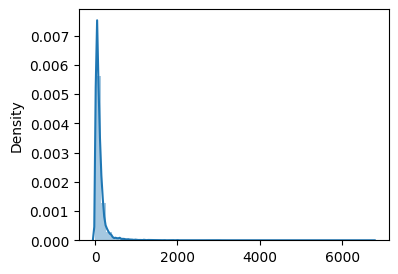

payment_value


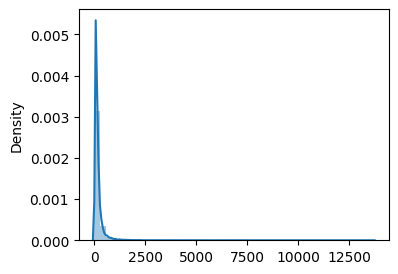

In [153]:
for col in df[['price','payment_value']]:
    print(col)
    plt.figure(figsize=(4, 3))   
    sns.distplot(df[[col]])
    plt.show()

### Observations:

#### Payment Value: The highest number of transactions is in the range of Rs 2000. This can happen because customers tend to buy goods at affordable prices.

In [154]:
#mostly selled product count
top_products = df.groupby("product_category_name_english").agg({"order_id": "count"}).sort_values("order_id", ascending=False).head(10)
top_products

,order_id
product_category_name_english,
bed_bath_table,11499
health_beauty,9653
sports_leisure,8637
furniture_decor,8486
computers_accessories,7881
housewares,7089
watches_gifts,5999
telephony,4547
garden_tools,4418


### RFM is a technique that can be used to perform Customer Segmentation to determine customers' buying behaviour.

#### Recency: days since last order
#### Frequency: Number of orders
#### Monetary: amount of total purchase

In [155]:
import datetime as dt

In [156]:
# Max time
max_time = df['order_purchase_timestamp'].max() + dt.timedelta(1)


In [157]:
# Groupby customer_unique_id
customer = df.groupby('customer_unique_id', as_index=False).agg(
    recency =  ('order_purchase_timestamp', lambda x: (max_time-x.max()).days),
    frequency = ('order_id', 'count'),
    monetary =  ('payment_value', 'sum'),
    most_payment_type = ('payment_type', lambda x: x.value_counts().index[0]),
    avg_review_score = ('review_score', 'mean'),
    most_product_buy = ('product_category_name_english', lambda x: x.value_counts().index[0]),
)

In [158]:
customer.head()

,customer_unique_id,recency,frequency,monetary,most_payment_type,avg_review_score,most_product_buy
0,0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90,credit_card,5.0,bed_bath_table
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19,credit_card,4.0,health_beauty
2,0000f46a3911fa3c0805444483337064,537,1,86.22,credit_card,3.0,stationery
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,credit_card,4.0,telephony
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,credit_card,5.0,telephony


In [159]:
customer.shape

(91479, 7)

In [160]:
customer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91479 entries, 0 to 91478
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   customer_unique_id  91479 non-null  object 
 1   recency             91479 non-null  int64  
 2   frequency           91479 non-null  int64  
 3   monetary            91479 non-null  float64
 4   most_payment_type   91479 non-null  object 
 5   avg_review_score    91479 non-null  float64
 6   most_product_buy    91479 non-null  object 
dtypes: float64(2), int64(2), object(3)
memory usage: 4.9+ MB


In [161]:
customer.isna().sum()

customer_unique_id    0
recency               0
frequency             0
monetary              0
most_payment_type     0
avg_review_score      0
most_product_buy      0
dtype: int64

In [162]:
cust=customer.copy()

In [163]:
customer.describe()

,recency,frequency,monetary,avg_review_score
count,91479.000000,91479.000000,91479.000000,91479.000000
mean,237.141584,1.226107,211.438145,4.154607
std,152.617063,0.756811,628.300017,1.279287
min,1.000000,1.000000,8.860000,1.000000
25%,114.000000,1.000000,63.620000,4.000000
50%,218.000000,1.000000,112.640000,5.000000
75%,345.000000,1.000000,201.840000,5.000000
max,695.000000,35.000000,109312.640000,5.000000


In [164]:
customer['frequency'].value_counts()

1     77797
2     10262
3      1856
4       847
5       272
6       245
7        56
8        35
10       23
12       22
9        20
11       16
14        7
24        3
20        3
15        3
21        2
13        2
19        1
17        1
18        1
22        1
16        1
34        1
30        1
35        1
Name: frequency, dtype: int64

In [165]:
customer['frequency'].nunique()

26

In [166]:
customer['monetary'].value_counts()

77.57      237
35.00      158
73.34      145
116.94     123
99.90      106
          ... 
115.03       1
220.18       1
543.84       1
275.81       1
4134.84      1
Name: monetary, Length: 30113, dtype: int64

In [167]:
customer['monetary'].nunique()

30113

In [168]:
customer.shape

(91479, 7)

In [169]:
customer['monetary'].sort_values(ascending=False)


3656     109312.64
70147     44048.00
22941     36489.24
85703     30186.00
42298     29099.52
           ...    
29484        10.71
67659        10.07
10845        10.06
17736         9.59
65049         8.86
Name: monetary, Length: 91479, dtype: float64

In [170]:
customer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91479 entries, 0 to 91478
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   customer_unique_id  91479 non-null  object 
 1   recency             91479 non-null  int64  
 2   frequency           91479 non-null  int64  
 3   monetary            91479 non-null  float64
 4   most_payment_type   91479 non-null  object 
 5   avg_review_score    91479 non-null  float64
 6   most_product_buy    91479 non-null  object 
dtypes: float64(2), int64(2), object(3)
memory usage: 4.9+ MB


In [171]:
customer.nunique().sort_values(ascending=False)


customer_unique_id    91479
monetary              30113
recency                 610
most_product_buy         71
avg_review_score         60
frequency                26
most_payment_type         4
dtype: int64

### Recency


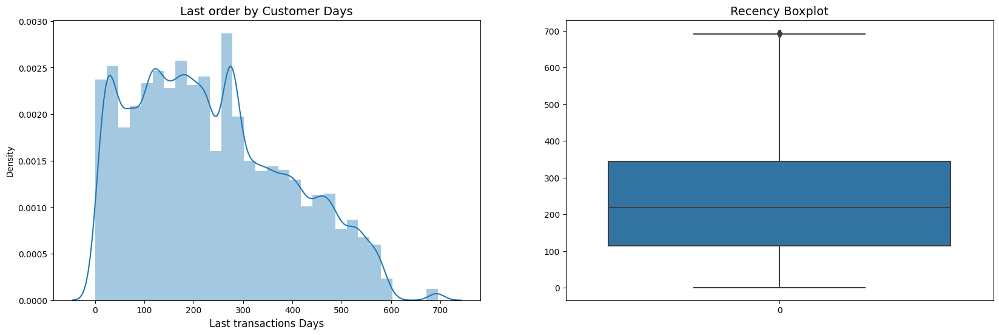

In [172]:
# checking distributions

plt.figure(figsize=(20, 6))
plt.subplot(121)
sns.distplot(customer['recency'], bins=30)
plt.title('Last order by Customer Days', fontsize=14)
plt.xlabel('Last transactions Days', fontsize=12)

plt.subplot(122)
sns.boxplot(customer['recency'])
plt.title('Recency Boxplot', fontsize=14)
plt.show()

# plt.show()

### monetary


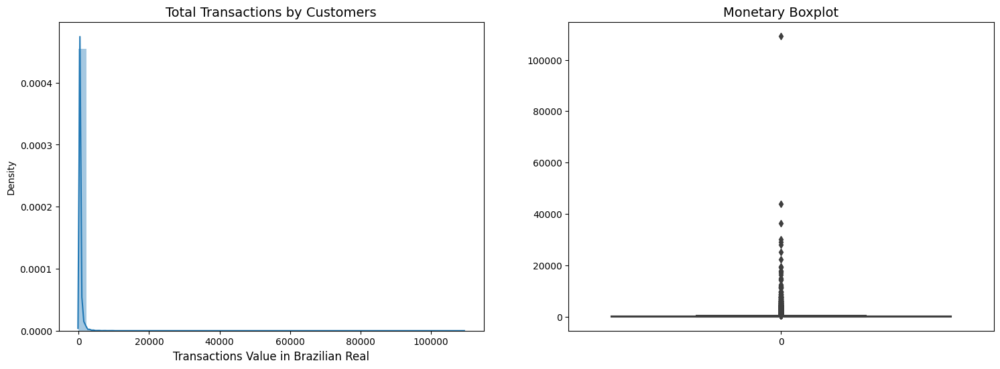

In [173]:
plt.figure(figsize=(18, 6))
plt.subplot(121)
sns.distplot(customer['monetary'])
plt.title('Total Transactions by Customers', fontsize=14)
plt.xlabel('Transactions Value in Brazilian Real', fontsize=12)

plt.subplot(122)
sns.boxplot(customer['monetary'])
plt.title('Monetary Boxplot', fontsize=14)
plt.show()

### frequency

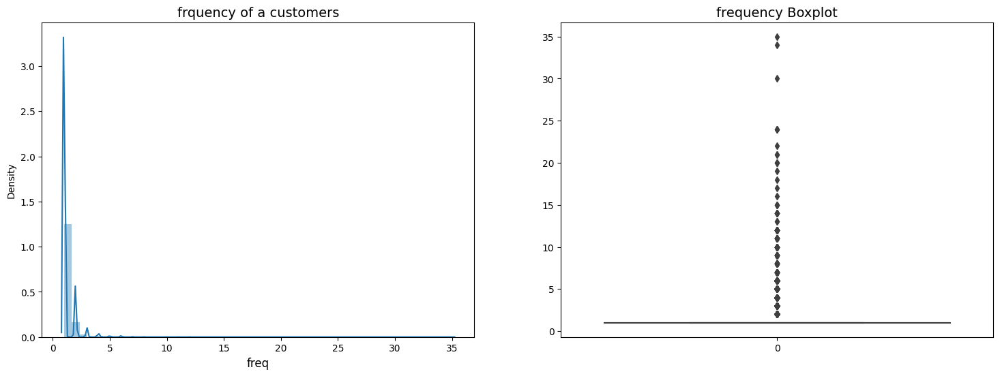

In [174]:
plt.figure(figsize=(18, 6))
plt.subplot(121)
sns.distplot(customer['frequency'])
plt.title('frquency of a customers', fontsize=14)
plt.xlabel('freq', fontsize=12)

plt.subplot(122)
sns.boxplot(customer['frequency'])
plt.title('frequency Boxplot', fontsize=14)
plt.show()

In [175]:
# conduct the  Shapiro-Wilk Test
from scipy.stats import norm
from scipy.stats import shapiro
cust= norm.rvs(size=10000)
shapiro(cust)

ShapiroResult(statistic=0.9996750354766846, pvalue=0.09886184334754944)

#### If the P-Value of the Shapiro Wilk Test is larger than 0.05, we assume a normal distribution
#### If the P-Value of the Shapiro Wilk Test is smaller than 0.05, we do not assume a normal distribution

#### creating list with diff datatypes

In [176]:
cat_col = list(customer.select_dtypes(['object']).columns)
float_col = list(customer.select_dtypes(['float64']).columns)
int_col = list(customer.select_dtypes(['int64']).columns)

In [177]:
cat_col

['customer_unique_id', 'most_payment_type', 'most_product_buy']

In [178]:
float_col

['monetary', 'avg_review_score']

In [179]:
int_col

['recency', 'frequency']

#### checking outliers with IQR method

In [180]:
for i in int_col:
    Q3, Q1 = np.percentile(customer[i], [75 ,25])
    iqr= Q3 - Q1
    low = Q1 - (1.5*iqr)
    high = Q3 + (1.5*iqr)
    x=customer[i][customer[i]>high]
    y=customer[i][customer[i]<low]
    print(i,'has ===>  ',x.shape[0]+y.shape[0],'outliers')

recency has ===>   153 outliers
frequency has ===>   13682 outliers


In [181]:
for i in float_col:
    Q3, Q1 = np.percentile(customer[i], [75 ,25])
    iqr= Q3 - Q1
    low = Q1 - (1.5*iqr)
    high = Q3 + (1.5*iqr)
    x=customer[i][customer[i]>high]
    y=customer[i][customer[i]<low]
    print(i,'has ===>  ',x.shape[0]+y.shape[0],'outliers')

monetary has ===>   8944 outliers
avg_review_score has ===>   11619 outliers


In [182]:
outlier=['monetary','avg_review_score','recency']

In [183]:
p0_ = []
p100_ = []
iqr_ = []
high_ = []
low_ = []

for i in outlier:
    p0 =customer[i].min()
    p100=customer[i].max()
    
    p0_.append(p0)
    p100_.append(p100)

    q1=customer[i].quantile(0.25)
    q2=customer[i].quantile(0.5)
    q3=customer[i].quantile(0.75)
    
    iqr=q3-q1
    iqr_.append(iqr)
    
    low: int = q1 - (1.5 * iqr)
    high: int = q3 + (1.5 * iqr)
    
    low_.append(low)
    high_.append(high)

    

In [184]:
p0_

[8.86, 1.0, 1]

In [185]:
p100_

[109312.64, 5.0, 695]

In [186]:
customer.describe()

,recency,frequency,monetary,avg_review_score
count,91479.000000,91479.000000,91479.000000,91479.000000
mean,237.141584,1.226107,211.438145,4.154607
std,152.617063,0.756811,628.300017,1.279287
min,1.000000,1.000000,8.860000,1.000000
25%,114.000000,1.000000,63.620000,4.000000
50%,218.000000,1.000000,112.640000,5.000000
75%,345.000000,1.000000,201.840000,5.000000
max,695.000000,35.000000,109312.640000,5.000000


In [187]:
high_ #iqr 75

[409.16999999999996, 6.5, 691.5]

In [188]:
low_ #iqr 25

[-143.70999999999998, 2.5, -232.5]

### Replacing outlier with flooring and capping

In [189]:
count = 0

for i in outlier:
    customer[i] = customer[i].clip(upper = high_[count], lower = low_[count])
    count+=1

In [190]:
for i in outlier:
    Q3, Q1 = np.percentile(customer[i], [75 ,25])
    iqr= Q3 - Q1
    low = Q1 - (1.5*iqr)
    high = Q3 + (1.5*iqr)
    x=customer[i][customer[i]>high]
    y=customer[i][customer[i]<low]
    print(i,'has ===>  ',x.shape[0]+y.shape[0],'outliers')

monetary has ===>   0 outliers
avg_review_score has ===>   0 outliers
recency has ===>   0 outliers


In [191]:
customer.head()

,customer_unique_id,recency,frequency,monetary,most_payment_type,avg_review_score,most_product_buy
0,0000366f3b9a7992bf8c76cfdf3221e2,112.0,1,141.90,credit_card,5.0,bed_bath_table
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115.0,1,27.19,credit_card,4.0,health_beauty
2,0000f46a3911fa3c0805444483337064,537.0,1,86.22,credit_card,3.0,stationery
3,0000f6ccb0745a6a4b88665a16c9f078,321.0,1,43.62,credit_card,4.0,telephony
4,0004aac84e0df4da2b147fca70cf8255,288.0,1,196.89,credit_card,5.0,telephony


In [192]:
customer.describe()


,recency,frequency,monetary,avg_review_score
count,91479.000000,91479.000000,91479.000000,91479.000000
mean,237.138420,1.226107,152.424754,4.313903
std,152.607616,0.756811,116.942437,0.927701
min,1.000000,1.000000,8.860000,2.500000
25%,114.000000,1.000000,63.620000,4.000000
50%,218.000000,1.000000,112.640000,5.000000
75%,345.000000,1.000000,201.840000,5.000000
max,691.500000,35.000000,409.170000,5.000000


In [193]:
customer['monetary'].value_counts()

409.17    8944
77.57      237
35.00      158
73.34      145
116.94     123
          ... 
275.96       1
376.97       1
239.73       1
357.74       1
200.90       1
Name: monetary, Length: 22588, dtype: int64

In [194]:
customer['monetary'].sort_values(ascending=False)

86607    409.17
40071    409.17
7664     409.17
29967    409.17
84418    409.17
          ...  
29484     10.71
67659     10.07
10845     10.06
17736      9.59
65049      8.86
Name: monetary, Length: 91479, dtype: float64

In [195]:
customer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91479 entries, 0 to 91478
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   customer_unique_id  91479 non-null  object 
 1   recency             91479 non-null  float64
 2   frequency           91479 non-null  int64  
 3   monetary            91479 non-null  float64
 4   most_payment_type   91479 non-null  object 
 5   avg_review_score    91479 non-null  float64
 6   most_product_buy    91479 non-null  object 
dtypes: float64(3), int64(1), object(3)
memory usage: 4.9+ MB


In [196]:
c1=customer.copy

### Recency

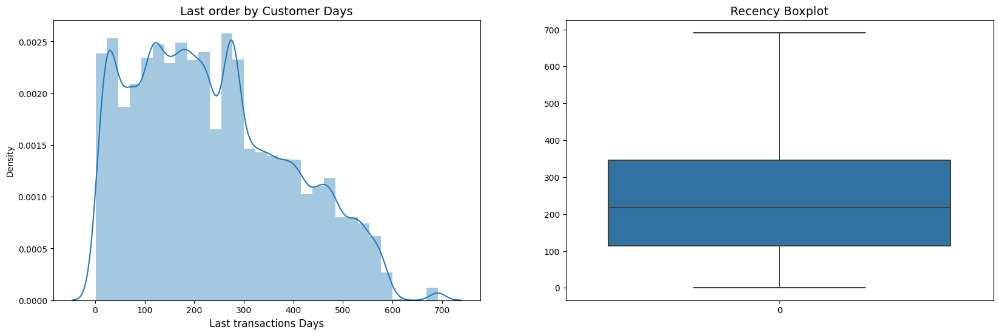

In [197]:
#recency
plt.figure(figsize=(20, 6))
plt.subplot(121)
sns.distplot(customer['recency'], bins=30)
plt.title('Last order by Customer Days', fontsize=14)
plt.xlabel('Last transactions Days', fontsize=12)

plt.subplot(122)
sns.boxplot(customer['recency'])
plt.title('Recency Boxplot', fontsize=14)
plt.show()

# plt.show()

### Monetary

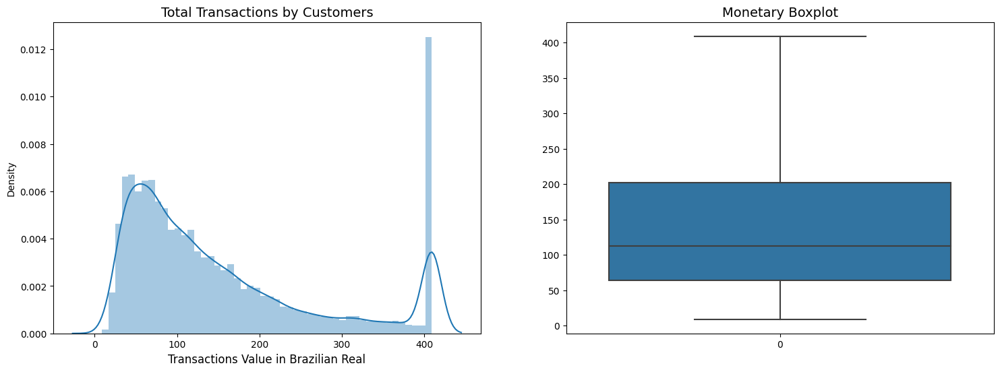

In [198]:
#monetary
plt.figure(figsize=(18, 6))
plt.subplot(121)
sns.distplot(customer['monetary'])
plt.title('Total Transactions by Customers', fontsize=14)
plt.xlabel('Transactions Value in Brazilian Real', fontsize=12)

plt.subplot(122)
sns.boxplot(customer['monetary'])
plt.title('Monetary Boxplot', fontsize=14)
plt.show()


### Frequency

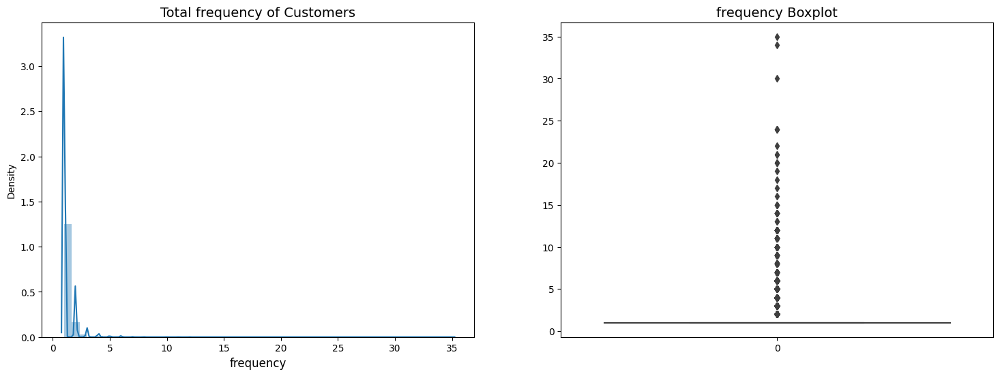

In [199]:
#frequency
plt.figure(figsize=(18, 6))
plt.subplot(121)
sns.distplot(customer['frequency'])
plt.title('Total frequency of Customers', fontsize=14)
plt.xlabel('frequency', fontsize=12)

plt.subplot(122)
sns.boxplot(customer['frequency'])
plt.title('frequency Boxplot', fontsize=14)
plt.show()

In [200]:
customer['recency'].describe()

count    91479.000000
mean       237.138420
std        152.607616
min          1.000000
25%        114.000000
50%        218.000000
75%        345.000000
max        691.500000
Name: recency, dtype: float64

#### The last time the customer made a transaction ranged from 1 day to 691 days (from the last date on the data)
#### On average, customers make the last transaction on 237 days or every 8 months (after the last order date)

In [201]:
customer['frequency'].describe()

count    91479.000000
mean         1.226107
std          0.756811
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max         35.000000
Name: frequency, dtype: float64

#### The number of transactions made by each customer is 1.
#### Each customer mostly orders only 1 time when using this e-commerce. 
#### Therefore, it is necessary to increase the number of transactions made by customers by conducting targeted marketing according to their segmentation.


In [202]:
customer['monetary'].describe()

count    91479.000000
mean       152.424754
std        116.942437
min          8.860000
25%         63.620000
50%        112.640000
75%        201.840000
max        409.170000
Name: monetary, dtype: float64

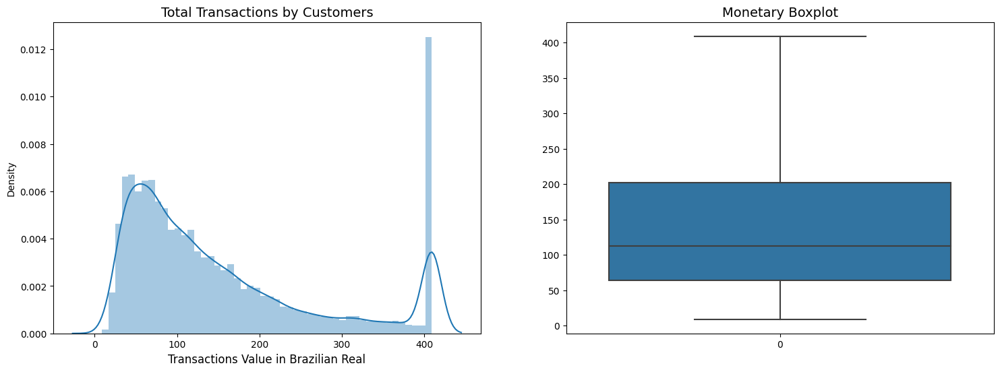

In [203]:
#monetary
plt.figure(figsize=(18, 6))
plt.subplot(121)
sns.distplot(customer['monetary'])
plt.title('Total Transactions by Customers', fontsize=14)
plt.xlabel('Transactions Value in Brazilian Real', fontsize=12)

plt.subplot(122)
sns.boxplot(customer['monetary'])
plt.title('Monetary Boxplot', fontsize=14)
plt.show()

#### majority of customers have relatively low purchasing power.

## K Means Clustering

In [204]:
x1=customer[['recency', 'frequency', 'monetary']]

In [205]:
x1.head()


,recency,frequency,monetary
0,112.0,1,141.90
1,115.0,1,27.19
2,537.0,1,86.22
3,321.0,1,43.62
4,288.0,1,196.89


In [206]:
x1.to_csv(r"C:\Users\Anik8\Desktop\Ecommerce\rfm1.csv",header=True,index=False)

In [207]:
print(x1.corr())


           recency  frequency  monetary
recency    1.00000   0.003460 -0.008700
frequency  0.00346   1.000000  0.381149
monetary  -0.00870   0.381149  1.000000


<AxesSubplot: >

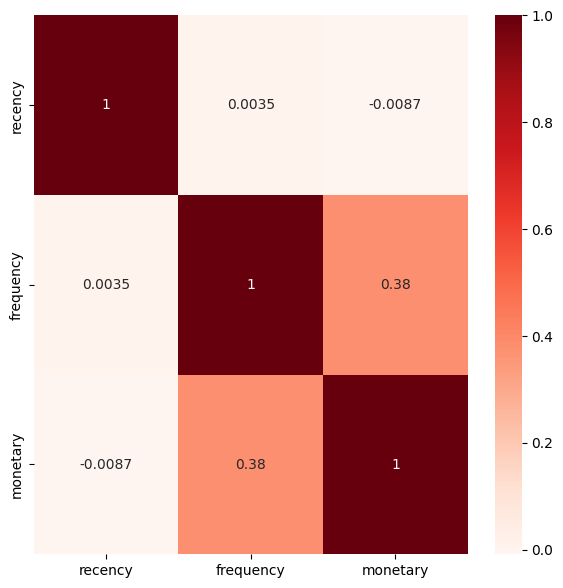

In [208]:
# plt.figure(figsize=(5, 4))
# sns.heatmap(x1, annot = True, cmap = sns.cubehelix_palette(as_cmap=True))
# plt.title('Correlation Heatmap')
# plt.show()

sns.heatmap(x1[['recency','frequency', 'monetary']].corr(),cmap="Reds",annot = True)

In [209]:
#importing libraries
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans

#scaling
scaler = MinMaxScaler()
x_scaled = scaler.fit_transform(x1) 
x_scaled

array([[0.16075308, 0.        , 0.33234243],
       [0.16509776, 0.        , 0.04578951],
       [0.77624909, 0.        , 0.19325023],
       ...,
       [0.8211441 , 0.        , 0.25879943],
       [0.17089066, 0.        , 0.31183333],
       [0.69949312, 0.        , 0.15662861]])

#### Finding optimal no. of clusters

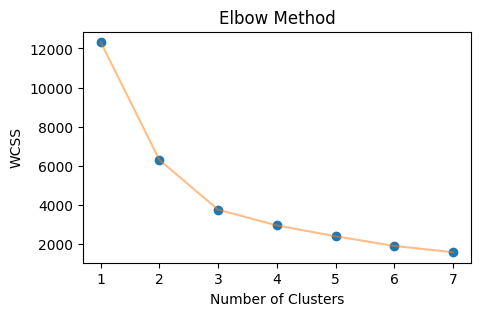

In [210]:
# Within Cluster Sum of Squared Errors (WCSS) 
wcss = []
for i in range(1,8):
    km = KMeans(n_clusters = i, init = 'k-means++')
    km.fit(x_scaled)
    wcss.append(km.inertia_)
    
plt.figure(1 , figsize = (5, 3))
plt.plot(np.arange(1 , 8) , wcss , 'o')
plt.plot(np.arange(1 , 8) , wcss , '-' , alpha = 0.5)
plt.xlabel('Number of Clusters') , plt.ylabel('WCSS')
plt.title('Elbow Method')
plt.show()

In [211]:
# # Silhouette analysis

# from sklearn.metrics import silhouette_score
# range_n_clusters = [2, 3, 4, 5]

# for num_clusters in range_n_clusters:
    
#     # intialise kmeans
#     kmeans = KMeans(n_clusters=num_clusters, max_iter=50)
#     kmeans.fit(x_scaled)
    
#     cluster_labels = kmeans.labels_
    
#     # silhouette score
#     silhouette_avg = silhouette_score(x_scaled, cluster_labels)
#     print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters, silhouette_avg))

### Silhouette Score
### The value of the silhouette coefﬁcient is between [-1, 1]

### k= 4

In [212]:
#training the K-means model on a dataset    
kmeans = KMeans(n_clusters=4, init='k-means++', random_state=42)
kmeans.fit(x_scaled)

customer['label_kmeans'] = kmeans.labels_

In [213]:
customer.head()

,customer_unique_id,recency,frequency,monetary,most_payment_type,avg_review_score,most_product_buy,label_kmeans
0,0000366f3b9a7992bf8c76cfdf3221e2,112.0,1,141.90,credit_card,5.0,bed_bath_table,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115.0,1,27.19,credit_card,4.0,health_beauty,0
2,0000f46a3911fa3c0805444483337064,537.0,1,86.22,credit_card,3.0,stationery,3
3,0000f6ccb0745a6a4b88665a16c9f078,321.0,1,43.62,credit_card,4.0,telephony,3
4,0004aac84e0df4da2b147fca70cf8255,288.0,1,196.89,credit_card,5.0,telephony,1


In [214]:
# customer.to_csv(r"C:\Users\Anik8\Desktop\Ecommerce\rfm2.csv",header=True,index=False)

<AxesSubplot: xlabel='label_kmeans', ylabel='recency'>

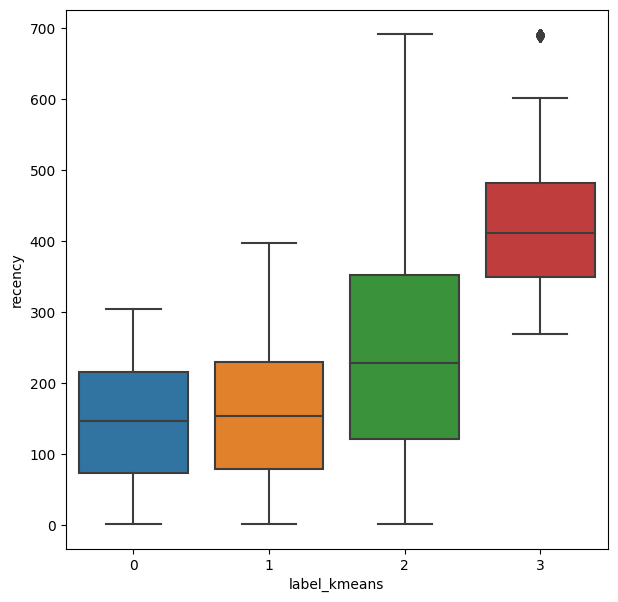

In [215]:
sns.boxplot(x='label_kmeans', y='recency', data=customer)

<AxesSubplot: xlabel='label_kmeans', ylabel='monetary'>

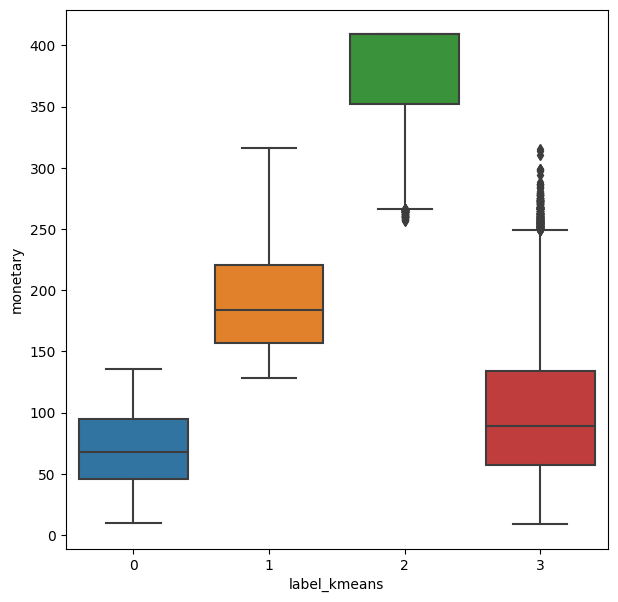

In [216]:
sns.boxplot(x='label_kmeans', y='monetary', data=customer)

In [217]:
# recency vs monetary

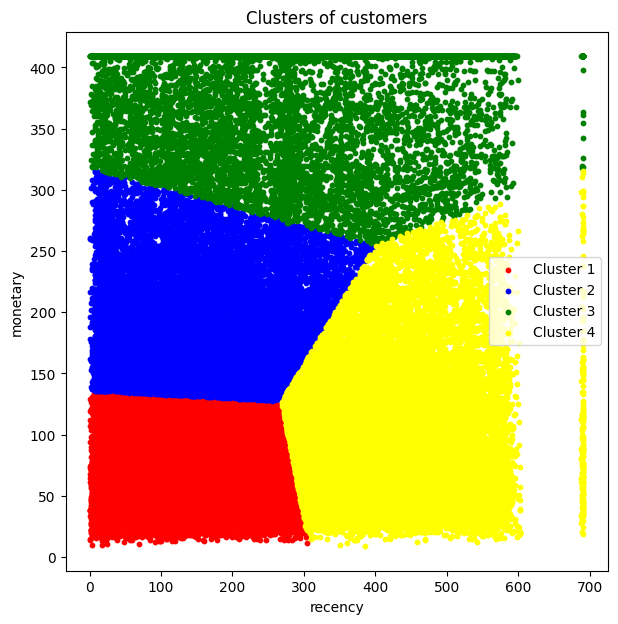

In [218]:
c0 = customer[customer['label_kmeans']==0]
c1 = customer[customer['label_kmeans']==1]
c2 = customer[customer['label_kmeans']==2]
c3 = customer[customer['label_kmeans']==3]

plt.scatter(c0['recency'],c0['monetary'],s=10, c = 'red', label = 'Cluster 1')
plt.scatter(c1['recency'],c1['monetary'] ,s = 10, c = 'blue', label = 'Cluster 2')
plt.scatter(c2['recency'],c2['monetary'],s = 10, c = 'green', label = 'Cluster 3')
plt.scatter(c3['recency'],c3['monetary'],s = 10, c = 'yellow', label = 'Cluster 4')

plt.title('Clusters of customers')   
plt.xlabel('recency')
plt.ylabel('monetary')
plt.legend()
plt.show()

In [219]:
# col1=['recency','monetary']
# from sklearn.metrics import silhouette_samples, silhouette_score
# km = KMeans(n_clusters = 4, init = 'k-means++', random_state = 42)
# km.fit(x1[col1])
# print(km.labels_)
# score = silhouette_score(x1[col1],km.labels_, metric='euclidean')
# print(score)

[1 1 0 ... 0 1 0]
0.4072112559804066

In [220]:
analysis = customer.groupby(['label_kmeans'])[['recency', 'frequency', 'monetary']].mean()
analysis

,recency,frequency,monetary
label_kmeans,,,
0,145.143037,1.053850,70.854527
1,156.576303,1.197844,191.697674
2,245.142740,1.864629,381.005683
3,419.458493,1.106077,101.031696


In [221]:
analysis.rename({0:'Lost Customers',1:'Loyal Customers',3:'New Customers',2:'Best Customers'})

,recency,frequency,monetary
label_kmeans,,,
Lost Customers,145.143037,1.053850,70.854527
Loyal Customers,156.576303,1.197844,191.697674
Best Customers,245.142740,1.864629,381.005683
New Customers,419.458493,1.106077,101.031696


In [222]:
# Labeling
customer['labels'] = customer['label_kmeans'].map({0:'Lost Customers',1:'Loyal Customers',3:'New Customers',2:'Best Customers'})

In [223]:
customer.describe()

,recency,frequency,monetary,avg_review_score,label_kmeans
count,91479.000000,91479.000000,91479.000000,91479.000000,91479.000000
mean,237.138420,1.226107,152.424754,4.313903,1.323408
std,152.607616,0.756811,116.942437,0.927701,1.226787
min,1.000000,1.000000,8.860000,2.500000,0.000000
25%,114.000000,1.000000,63.620000,4.000000,0.000000
50%,218.000000,1.000000,112.640000,5.000000,1.000000
75%,345.000000,1.000000,201.840000,5.000000,3.000000
max,691.500000,35.000000,409.170000,5.000000,3.000000


In [224]:
customer.head()

,customer_unique_id,recency,frequency,monetary,most_payment_type,avg_review_score,most_product_buy,label_kmeans,labels
0,0000366f3b9a7992bf8c76cfdf3221e2,112.0,1,141.90,credit_card,5.0,bed_bath_table,1,Loyal Customers
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115.0,1,27.19,credit_card,4.0,health_beauty,0,Lost Customers
2,0000f46a3911fa3c0805444483337064,537.0,1,86.22,credit_card,3.0,stationery,3,New Customers
3,0000f6ccb0745a6a4b88665a16c9f078,321.0,1,43.62,credit_card,4.0,telephony,3,New Customers
4,0004aac84e0df4da2b147fca70cf8255,288.0,1,196.89,credit_card,5.0,telephony,1,Loyal Customers


In [225]:
# customer.to_csv(r"C:\Users\Anik8\Desktop\Ecommerce\customer_label.csv",header=True,index=False)

In [226]:
grp0 = customer[customer["label_kmeans"]==0].copy()
grp1 = customer[customer["label_kmeans"]==1].copy()
grp2 = customer[customer["label_kmeans"]==2].copy()
grp3 = customer[customer["label_kmeans"]==3].copy()

In [227]:
grp0.describe()

,recency,frequency,monetary,avg_review_score,label_kmeans
count,34243.000000,34243.000000,34243.000000,34243.000000,34243.0
mean,145.143037,1.053850,70.854527,4.349719,0.0
std,83.451524,0.309531,29.891729,0.904672,0.0
min,1.000000,1.000000,9.590000,2.500000,0.0
25%,73.000000,1.000000,45.480000,4.000000,0.0
50%,146.000000,1.000000,67.500000,5.000000,0.0
75%,216.000000,1.000000,94.740000,5.000000,0.0
max,304.000000,19.000000,135.820000,5.000000,0.0


In [228]:
grp1.describe()

,recency,frequency,monetary,avg_review_score,label_kmeans
count,17994.000000,17994.000000,17994.000000,17994.000000,17994.0
mean,156.576303,1.197844,191.697674,4.295486,1.0
std,91.534142,0.488498,42.755745,0.941998,0.0
min,1.000000,1.000000,127.830000,2.500000,1.0
25%,79.000000,1.000000,156.440000,4.000000,1.0
50%,154.000000,1.000000,183.930000,5.000000,1.0
75%,230.000000,1.000000,220.732500,5.000000,1.0
max,397.000000,8.000000,316.400000,5.000000,1.0


In [229]:
grp2.describe()

,recency,frequency,monetary,avg_review_score,label_kmeans
count,14656.000000,14656.000000,14656.000000,14656.000000,14656.0
mean,245.142740,1.864629,381.005683,4.160941,2.0
std,151.160422,1.457119,41.998452,1.014497,0.0
min,1.000000,1.000000,256.340000,2.500000,2.0
25%,121.000000,1.000000,351.982500,3.000000,2.0
50%,228.000000,1.000000,409.170000,5.000000,2.0
75%,352.000000,2.000000,409.170000,5.000000,2.0
max,691.500000,35.000000,409.170000,5.000000,2.0


In [230]:
grp3.describe()

,recency,frequency,monetary,avg_review_score,label_kmeans
count,24586.000000,24586.000000,24586.000000,24586.000000,24586.0
mean,419.458493,1.106077,101.031696,4.368680,3.0
std,85.939974,0.508034,55.370318,0.883446,0.0
min,269.000000,1.000000,8.860000,2.500000,3.0
25%,349.000000,1.000000,57.515000,4.000000,3.0
50%,411.000000,1.000000,89.170000,5.000000,3.0
75%,481.000000,1.000000,134.075000,5.000000,3.0
max,691.500000,30.000000,315.240000,5.000000,3.0


### grp 2 has high monetary with low min recency

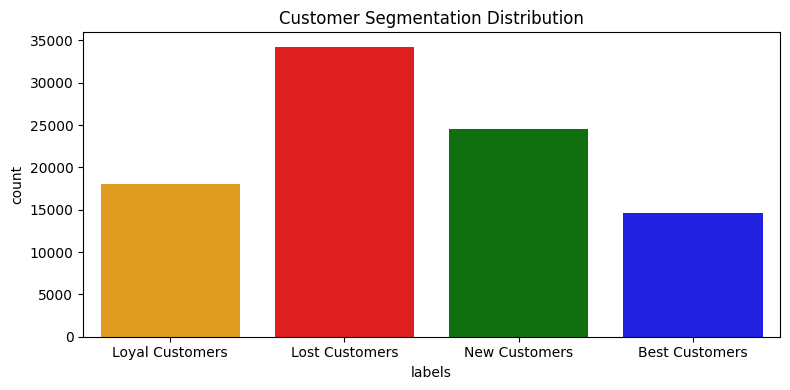

In [231]:
plt.figure(figsize = (8,4))
plots = sns.countplot(x='labels', data = customer, palette=['orange', 'red', 'green', 'blue'])
plt.title('Customer Segmentation Distribution')
plt.tight_layout()
plt.show()

In [232]:
# RFM Segmentation Group by for analysis
rfm_segment = customer.groupby(['labels', 'label_kmeans']).agg(
    n_customer = ('customer_unique_id', 'count'),
    mean_recency =  ('recency', 'mean'),
    min_recency = ('recency', 'min'),
    max_rencency = ('recency', 'max'),
    mean_freq = ('frequency', 'mean'),
    min_freq = ('frequency', 'min'),
    max_freq = ('frequency', 'max'),
    mean_monetary =  ('monetary', 'mean'),
    min_monetary = ('monetary', 'min'),
    max_monetary = ('monetary', 'max'),
    most_payment_type = ('most_payment_type', lambda x: x.value_counts().index[0]),
    most_product_buy = ('most_product_buy', lambda x: x.value_counts().index[0]),
).sort_values(by='n_customer')
   


In [233]:
rfm_segment

,,n_customer,mean_recency,min_recency,max_rencency,mean_freq,min_freq,max_freq,mean_monetary,min_monetary,max_monetary,most_payment_type,most_product_buy
labels,label_kmeans,,,,,,,,,,,,
Best Customers,2,14656,245.142740,1.0,691.5,1.864629,1,35,381.005683,256.34,409.17,credit_card,health_beauty
Loyal Customers,1,17994,156.576303,1.0,397.0,1.197844,1,8,191.697674,127.83,316.40,credit_card,watches_gifts
New Customers,3,24586,419.458493,269.0,691.5,1.106077,1,30,101.031696,8.86,315.24,credit_card,bed_bath_table
Lost Customers,0,34243,145.143037,1.0,304.0,1.053850,1,19,70.854527,9.59,135.82,credit_card,health_beauty


In [234]:
# rfm_segment.to_csv(r"C:\Users\Anik8\Desktop\Ecommerce\rfm3.csv",header=True,index=False)

### Best Customers:
This segment consists of 14656 customers.
The average total transaction per customer is around 381 and an average last purchase time of around 245 days
Most customers buy the health beauty products with credit card payment method.Segment has highest frequency.

### Loyal Customers:
This segment consists of 17994 customers
The average total transaction per customer is around 191.69 and an average last purchase time of around 156 days
Most customers buy the watch gift product. segment has lowest frequency range.

### New Customers:
This segment consists of 24586 customers. 
The average total transaction per customer is around 101.03 and an average last purchase time of around 419 days
Most customers buy the bed bath table category purchase. segment has low min recency.

### Lost Customers:
This segment consists of 34243 customers.
The average total transaction per customer is around 70.85 and an average last purchase time of around 145 days
Most customers buy the health beauty category products. Lowest Monetary.

- Segment 0 = Customers with high recency. (small segment but valuable)
- Segment 1 = Customers with low recency and balanced monetary. 
- Segment 2 = Customers that has lowest minimum recency.
- Segment 3 = Customer with low transactions in purchase.
